In [2]:
# Cell 1
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import io
import os
from sklearn.preprocessing import MinMaxScaler
from tqdm import tqdm
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
import random
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score

C:\Users\annek\AppData\Local\Temp\ipykernel_5256\1911745897.py:18: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, skiprows=1, header=None, delim_whitespace=True)


Modified timestamps for file u00047s00001_hw00006.svc:
0     0
1     8
2    15
3    23
4    30
Name: timestamp, dtype: int32


Modified timestamps for file u00039s00001_hw00006.svc:
0     0
1     8
2    15
3    23
4    30
Name: timestamp, dtype: int32


Modified timestamps for file u00027s00001_hw00006.svc:
0     0
1     8
2    15
3    23
4    30
Name: timestamp, dtype: int32




C:\Users\annek\AppData\Local\Temp\ipykernel_5256\1911745897.py:18: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, skiprows=1, header=None, delim_whitespace=True)
C:\Users\annek\AppData\Local\Temp\ipykernel_5256\1911745897.py:18: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, skiprows=1, header=None, delim_whitespace=True)
C:\Users\annek\AppData\Local\Temp\ipykernel_5256\1911745897.py:18: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, skiprows=1, header=None, delim_whitespace=True)


Modified timestamps for file u00013s00001_hw00006.svc:
0     0
1     7
2    15
3    22
4    30
Name: timestamp, dtype: int32


Modified timestamps for file u00078s00001_hw00006.svc:
0     0
1     7
2    15
3    22
4    30
Name: timestamp, dtype: int32


Modified timestamps for file u00040s00001_hw00006.svc:
0     0
1     7
2    15
3    22
4    30
Name: timestamp, dtype: int32




C:\Users\annek\AppData\Local\Temp\ipykernel_5256\1911745897.py:18: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, skiprows=1, header=None, delim_whitespace=True)
C:\Users\annek\AppData\Local\Temp\ipykernel_5256\1911745897.py:18: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, skiprows=1, header=None, delim_whitespace=True)
C:\Users\annek\AppData\Local\Temp\ipykernel_5256\1911745897.py:18: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, skiprows=1, header=None, delim_whitespace=True)


Modified timestamps for file u00056s00001_hw00006.svc:
0     0
1     8
2    15
3    23
4    30
Name: timestamp, dtype: int32


Modified timestamps for file u00071s00001_hw00006.svc:
0     0
1     8
2    15
3    23
4    30
Name: timestamp, dtype: int32


Modified timestamps for file u00069s00001_hw00006.svc:
0     0
1     7
2    15
3    22
4    30
Name: timestamp, dtype: int32




C:\Users\annek\AppData\Local\Temp\ipykernel_5256\1911745897.py:18: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, skiprows=1, header=None, delim_whitespace=True)
C:\Users\annek\AppData\Local\Temp\ipykernel_5256\1911745897.py:18: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, skiprows=1, header=None, delim_whitespace=True)
C:\Users\annek\AppData\Local\Temp\ipykernel_5256\1911745897.py:18: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, skiprows=1, header=None, delim_whitespace=True)


Modified timestamps for file u00072s00001_hw00006.svc:
0     0
1     8
2    15
3    23
4    30
Name: timestamp, dtype: int32




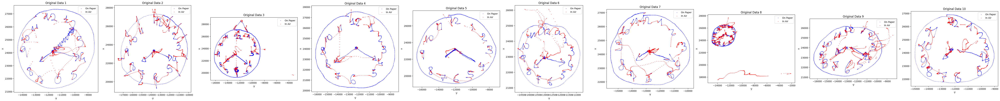

Number of processed files: 10
Average number of data points: 3699


In [32]:
# Cell 2
def upload_and_process_files(directory, num_files_to_use=None):
    svc_files = [f for f in os.listdir(directory) if f.endswith('.svc')]
    
    if num_files_to_use:
        svc_files = random.sample(svc_files, num_files_to_use)

    data_frames = []
    scalers = []

    num_files = len(svc_files)
    fig, axs = plt.subplots(1, num_files, figsize=(6*num_files, 6), constrained_layout=True)
    if num_files == 1:
        axs = [axs]

    for i, filename in enumerate(svc_files):
        file_path = os.path.join(directory, filename)
        df = pd.read_csv(file_path, skiprows=1, header=None, delim_whitespace=True)
        df.columns = ['x', 'y', 'timestamp', 'pen_status', 'pressure', 'azimuth', 'altitude']
        
        # Modify timestamp to start from 0
        df['timestamp'] = (df['timestamp'] - df['timestamp'].min()).round().astype(int)
        
        df = df.iloc[:, [0, 1, 2, 3]]  # Select x, y, timestamp, and pen_status
        data_frames.append(df)
        scaler = MinMaxScaler()
        normalized_data = scaler.fit_transform(df[['x', 'y', 'timestamp']])
        scalers.append(scaler)

        on_paper = df[df['pen_status'] == 1]
        in_air = df[df['pen_status'] == 0]
        axs[i].scatter(-on_paper['y'], on_paper['x'], c='blue', s=1, alpha=0.7, label='On Paper')
        axs[i].scatter(-in_air['y'], in_air['x'], c='red', s=1, alpha=0.7, label='In Air')
        axs[i].set_title(f'Original Data {i + 1}')
        axs[i].set_xlabel('-y')
        axs[i].set_ylabel('x')
        axs[i].legend()
        axs[i].set_aspect('equal')

        # Print the first few rows of the timestamp column
        print(f"Modified timestamps for file {filename}:")
        print(df['timestamp'].head())
        print("\n")

    plt.show()

    processed_data = [np.column_stack((scaler.transform(df[['x', 'y', 'timestamp']]), df['pen_status'].values)) 
                      for df, scaler in zip(data_frames, scalers)]
    avg_data_points = int(np.mean([df.shape[0] for df in data_frames]))

    return data_frames, processed_data, scalers, avg_data_points

directory = 'Task6'  # Directory where the .svc files are stored
data_frames, processed_data, scalers, avg_data_points = upload_and_process_files(directory, num_files_to_use=10)
print(f"Number of processed files: {len(processed_data)}")
print(f"Average number of data points: {avg_data_points}")

In [36]:
# Cell 3 (modified)
class VAE(tf.keras.Model):
    def __init__(self, latent_dim, beta=1.0):
        super(VAE, self).__init__()
        self.latent_dim = latent_dim
        self.beta = beta
        self.encoder = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_shape=(4,)),  # Changed to 4 for x, y, timestamp, pen_status
            tf.keras.layers.Dense(128, activation='relu'),
            tf.keras.layers.Dense(64, activation='relu'),
            tf.keras.layers.Dense(32, activation='relu'),
            tf.keras.layers.Dense(latent_dim * 2)
        ])
        self.decoder = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
            tf.keras.layers.Dense(32, activation='relu'),
            tf.keras.layers.Dense(64, activation='relu'),
            tf.keras.layers.Dense(128, activation='relu'),
            tf.keras.layers.Dense(4)  # Changed to 4 for x, y, timestamp, pen_status
        ])

    def encode(self, x):
        mean, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
        return mean, logvar

    def reparameterize(self, mean, logvar):
        eps = tf.random.normal(shape=mean.shape)
        return eps * tf.exp(logvar * .5) + mean

    def decode(self, z):
        decoded = self.decoder(z)
        xy_timestamp = tf.sigmoid(decoded[:, :3])  # x, y, and timestamp
        pen_status = tf.sigmoid(decoded[:, 3])
        return tf.concat([xy_timestamp, tf.expand_dims(pen_status, -1)], axis=1)

    def call(self, inputs):
        mean, logvar = self.encode(inputs)
        z = self.reparameterize(mean, logvar)
        return self.decode(z), mean, logvar


# New: LSTM Discriminator for GAN
class LSTMDiscriminator(tf.keras.Model):
    def __init__(self):
        super(LSTMDiscriminator, self).__init__()
        self.model = Sequential()
        self.model.add(LSTM(64, return_sequences=True, input_shape=(None, 4)))  # LSTM for sequence learning
        self.model.add(LSTM(32))
        self.model.add(Dense(1, activation='sigmoid'))  # Binary classification

    def call(self, x):
        return self.model(x)

# Function to compute VAE loss
def compute_loss(model, x):
    x_reconstructed, mean, logvar = model(x)
    reconstruction_loss_xy_timestamp = tf.reduce_mean(tf.keras.losses.mse(x[:, :3], x_reconstructed[:, :3]))
    reconstruction_loss_pen = tf.reduce_mean(tf.keras.losses.binary_crossentropy(x[:, 3], x_reconstructed[:, 3]))
    kl_loss = -0.5 * tf.reduce_mean(1 + logvar - tf.square(mean) - tf.exp(logvar))
    return reconstruction_loss_xy_timestamp + reconstruction_loss_pen, kl_loss, model.beta * kl_loss


latent_dim = 256
beta = 0.000001
learning_rate = 0.001

vae = VAE(latent_dim, beta)
optimizer = tf.keras.optimizers.Adam(learning_rate)

C:\Users\annek\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\core\input_layer.py:26: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [34]:
# Cell 4 (modified)
def generate_augmented_data(model, num_augmented_files, avg_data_points, processed_data, variability=0.05):
    augmented_datasets = []
    
    for _ in range(num_augmented_files):
        # Randomly select one of the processed datasets
        selected_data = random.choice(processed_data)
        
        mean, logvar = model.encode(tf.convert_to_tensor(selected_data, dtype=tf.float32))
        z = model.reparameterize(mean, logvar)
        augmented_data = model.decode(z).numpy()

        # Determine the number of data points for this augmented dataset
        # num_points = int(avg_data_points * (1 + variability * (random.random() - 0.5) * 2))
        
        # # Truncate or pad the augmented data to match the number of points
        # if num_points < augmented_data.shape[0]:
        #     augmented_data = augmented_data[:num_points]
        # else:
        #     padding = np.zeros((num_points - augmented_data.shape[0], augmented_data.shape[1]))
        #     augmented_data = np.vstack([augmented_data, padding])

        # Post-process pen status
        augmented_data[:, 3] = post_process_pen_status(augmented_data[:, 3])
        
        # Ensure timestamps are in sequence
        augmented_data[:, 2] = np.sort(augmented_data[:, 2])
        
        augmented_datasets.append(augmented_data)

    return augmented_datasets

def post_process_pen_status(pen_status, threshold=0.5, min_segment_length=5):
    binary_pen_status = (pen_status > threshold).astype(int)
    
    # Smooth out rapid changes
    for i in range(len(binary_pen_status) - min_segment_length):
        if np.all(binary_pen_status[i:i+min_segment_length] == binary_pen_status[i]):
            binary_pen_status[i:i+min_segment_length] = binary_pen_status[i]
    
    return binary_pen_status



C:\Users\annek\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
Epoch 1/300: 100%|██████████| 77/77 [00:28<00:00,  2.72batch/s, Total Loss=0.124, Reconstruction Loss=0.12, KL Loss=0.319]    


Epoch 1: Total Loss = 0.365790, Reconstruction Loss = 0.364463, KL Divergence Loss = 0.132692
MAE = 0.211688, MSE = 0.064503, NRMSE = 0.253401


Epoch 2/300: 100%|██████████| 77/77 [00:01<00:00, 51.12batch/s, Total Loss=0.0739, Reconstruction Loss=0.0722, KL Loss=0.168]


Epoch 2: Total Loss = 0.073418, Reconstruction Loss = 0.071366, KL Divergence Loss = 0.205205
MAE = 0.221875, MSE = 0.070431, NRMSE = 0.263769


Epoch 3/300: 100%|██████████| 77/77 [00:01<00:00, 52.48batch/s, Total Loss=0.0682, Reconstruction Loss=0.0668, KL Loss=0.135]


Epoch 3: Total Loss = 0.061347, Reconstruction Loss = 0.059423, KL Divergence Loss = 0.192389
MAE = 0.217831, MSE = 0.067882, NRMSE = 0.259188


Epoch 4/300: 100%|██████████| 77/77 [00:01<00:00, 49.12batch/s, Total Loss=0.0596, Reconstruction Loss=0.058, KL Loss=0.16]  


Epoch 4: Total Loss = 0.058023, Reconstruction Loss = 0.056130, KL Divergence Loss = 0.189315
MAE = 0.224855, MSE = 0.071112, NRMSE = 0.265820


Epoch 5/300: 100%|██████████| 77/77 [00:01<00:00, 49.16batch/s, Total Loss=0.0434, Reconstruction Loss=0.0414, KL Loss=0.2]  


Epoch 5: Total Loss = 0.048509, Reconstruction Loss = 0.046288, KL Divergence Loss = 0.222111
MAE = 0.229401, MSE = 0.074590, NRMSE = 0.272467


Epoch 6/300: 100%|██████████| 77/77 [00:01<00:00, 52.07batch/s, Total Loss=0.0464, Reconstruction Loss=0.0446, KL Loss=0.186]


Epoch 6: Total Loss = 0.042873, Reconstruction Loss = 0.040558, KL Divergence Loss = 0.231472
MAE = 0.230096, MSE = 0.074688, NRMSE = 0.272353


Epoch 7/300: 100%|██████████| 77/77 [00:01<00:00, 51.98batch/s, Total Loss=0.037, Reconstruction Loss=0.0351, KL Loss=0.197] 


Epoch 7: Total Loss = 0.039442, Reconstruction Loss = 0.037103, KL Divergence Loss = 0.233901
MAE = 0.235453, MSE = 0.078282, NRMSE = 0.278441


Epoch 8/300: 100%|██████████| 77/77 [00:01<00:00, 52.15batch/s, Total Loss=0.0374, Reconstruction Loss=0.0354, KL Loss=0.205]


Epoch 8: Total Loss = 0.036035, Reconstruction Loss = 0.033489, KL Divergence Loss = 0.254597
MAE = 0.246912, MSE = 0.087141, NRMSE = 0.293015


Epoch 9/300: 100%|██████████| 77/77 [00:01<00:00, 51.51batch/s, Total Loss=0.0302, Reconstruction Loss=0.028, KL Loss=0.223] 


Epoch 9: Total Loss = 0.035250, Reconstruction Loss = 0.032461, KL Divergence Loss = 0.278903
MAE = 0.263137, MSE = 0.101178, NRMSE = 0.315161


Epoch 10/300: 100%|██████████| 77/77 [00:01<00:00, 51.92batch/s, Total Loss=0.0229, Reconstruction Loss=0.0206, KL Loss=0.234] 


Epoch 10: Total Loss = 0.028660, Reconstruction Loss = 0.025646, KL Divergence Loss = 0.301397
MAE = 0.304552, MSE = 0.138150, NRMSE = 0.367847


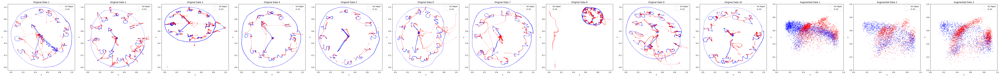

Epoch 11/300: 100%|██████████| 77/77 [00:01<00:00, 47.09batch/s, Total Loss=0.0201, Reconstruction Loss=0.0174, KL Loss=0.266] 


Epoch 11: Total Loss = 0.022068, Reconstruction Loss = 0.018895, KL Divergence Loss = 0.317319
MAE = 0.341037, MSE = 0.172119, NRMSE = 0.410645


Epoch 12/300: 100%|██████████| 77/77 [00:01<00:00, 50.94batch/s, Total Loss=0.0111, Reconstruction Loss=0.00777, KL Loss=0.333] 


Epoch 12: Total Loss = 0.015509, Reconstruction Loss = 0.012108, KL Divergence Loss = 0.340029
MAE = 0.343520, MSE = 0.175919, NRMSE = 0.415362


Epoch 13/300: 100%|██████████| 77/77 [00:01<00:00, 51.36batch/s, Total Loss=0.00887, Reconstruction Loss=0.00567, KL Loss=0.32] 


Epoch 13: Total Loss = 0.010754, Reconstruction Loss = 0.006929, KL Divergence Loss = 0.382440
MAE = 0.326076, MSE = 0.158510, NRMSE = 0.394053


Epoch 14/300: 100%|██████████| 77/77 [00:01<00:00, 51.42batch/s, Total Loss=0.00769, Reconstruction Loss=0.00443, KL Loss=0.326]


Epoch 14: Total Loss = 0.009414, Reconstruction Loss = 0.005473, KL Divergence Loss = 0.394113
MAE = 0.319545, MSE = 0.152069, NRMSE = 0.385851


Epoch 15/300: 100%|██████████| 77/77 [00:01<00:00, 50.82batch/s, Total Loss=0.00736, Reconstruction Loss=0.00448, KL Loss=0.288]


Epoch 15: Total Loss = 0.008426, Reconstruction Loss = 0.004797, KL Divergence Loss = 0.362941
MAE = 0.310171, MSE = 0.143134, NRMSE = 0.374258


Epoch 16/300: 100%|██████████| 77/77 [00:01<00:00, 52.67batch/s, Total Loss=0.00694, Reconstruction Loss=0.00391, KL Loss=0.303]


Epoch 16: Total Loss = 0.008652, Reconstruction Loss = 0.004983, KL Divergence Loss = 0.366920
MAE = 0.306192, MSE = 0.139284, NRMSE = 0.369232


Epoch 17/300: 100%|██████████| 77/77 [00:01<00:00, 51.17batch/s, Total Loss=0.00691, Reconstruction Loss=0.00408, KL Loss=0.284]


Epoch 17: Total Loss = 0.007441, Reconstruction Loss = 0.004167, KL Divergence Loss = 0.327370
MAE = 0.301488, MSE = 0.134852, NRMSE = 0.363209


Epoch 18/300: 100%|██████████| 77/77 [00:01<00:00, 49.81batch/s, Total Loss=0.00637, Reconstruction Loss=0.00315, KL Loss=0.322]


Epoch 18: Total Loss = 0.007292, Reconstruction Loss = 0.003938, KL Divergence Loss = 0.335427
MAE = 0.298558, MSE = 0.132071, NRMSE = 0.359551


Epoch 19/300: 100%|██████████| 77/77 [00:01<00:00, 49.58batch/s, Total Loss=0.00627, Reconstruction Loss=0.00344, KL Loss=0.283]


Epoch 19: Total Loss = 0.007053, Reconstruction Loss = 0.003731, KL Divergence Loss = 0.332219
MAE = 0.296774, MSE = 0.130198, NRMSE = 0.356888


Epoch 20/300: 100%|██████████| 77/77 [00:01<00:00, 49.33batch/s, Total Loss=0.00604, Reconstruction Loss=0.00319, KL Loss=0.285]


Epoch 20: Total Loss = 0.006535, Reconstruction Loss = 0.003344, KL Divergence Loss = 0.319155
MAE = 0.294459, MSE = 0.127966, NRMSE = 0.353952


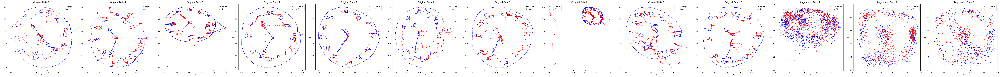

Epoch 21/300: 100%|██████████| 77/77 [00:01<00:00, 53.82batch/s, Total Loss=0.00642, Reconstruction Loss=0.00325, KL Loss=0.317]


Epoch 21: Total Loss = 0.006477, Reconstruction Loss = 0.003354, KL Divergence Loss = 0.312312
MAE = 0.289961, MSE = 0.124223, NRMSE = 0.348705


Epoch 22/300: 100%|██████████| 77/77 [00:01<00:00, 54.40batch/s, Total Loss=0.00543, Reconstruction Loss=0.00239, KL Loss=0.304]


Epoch 22: Total Loss = 0.006927, Reconstruction Loss = 0.003415, KL Divergence Loss = 0.351176
MAE = 0.290516, MSE = 0.124303, NRMSE = 0.348908


Epoch 23/300: 100%|██████████| 77/77 [00:01<00:00, 50.12batch/s, Total Loss=0.00558, Reconstruction Loss=0.00267, KL Loss=0.291]


Epoch 23: Total Loss = 0.005913, Reconstruction Loss = 0.002935, KL Divergence Loss = 0.297760
MAE = 0.284604, MSE = 0.119127, NRMSE = 0.341493


Epoch 24/300: 100%|██████████| 77/77 [00:01<00:00, 54.39batch/s, Total Loss=0.00529, Reconstruction Loss=0.00258, KL Loss=0.271]


Epoch 24: Total Loss = 0.005614, Reconstruction Loss = 0.002730, KL Divergence Loss = 0.288430
MAE = 0.282234, MSE = 0.117249, NRMSE = 0.338806


Epoch 25/300: 100%|██████████| 77/77 [00:01<00:00, 54.43batch/s, Total Loss=0.00494, Reconstruction Loss=0.00223, KL Loss=0.271]


Epoch 25: Total Loss = 0.005434, Reconstruction Loss = 0.002616, KL Divergence Loss = 0.281832
MAE = 0.280383, MSE = 0.115748, NRMSE = 0.336732


Epoch 26/300: 100%|██████████| 77/77 [00:01<00:00, 52.05batch/s, Total Loss=0.00507, Reconstruction Loss=0.00234, KL Loss=0.272]


Epoch 26: Total Loss = 0.005704, Reconstruction Loss = 0.002684, KL Divergence Loss = 0.301963
MAE = 0.279500, MSE = 0.114633, NRMSE = 0.335004


Epoch 27/300: 100%|██████████| 77/77 [00:01<00:00, 53.50batch/s, Total Loss=0.00484, Reconstruction Loss=0.00218, KL Loss=0.266]


Epoch 27: Total Loss = 0.005165, Reconstruction Loss = 0.002462, KL Divergence Loss = 0.270296
MAE = 0.279761, MSE = 0.115101, NRMSE = 0.335707


Epoch 28/300: 100%|██████████| 77/77 [00:01<00:00, 52.89batch/s, Total Loss=0.00452, Reconstruction Loss=0.00193, KL Loss=0.259]


Epoch 28: Total Loss = 0.005055, Reconstruction Loss = 0.002335, KL Divergence Loss = 0.272072
MAE = 0.272679, MSE = 0.109086, NRMSE = 0.326966


Epoch 29/300: 100%|██████████| 77/77 [00:01<00:00, 52.31batch/s, Total Loss=0.00476, Reconstruction Loss=0.00204, KL Loss=0.272]


Epoch 29: Total Loss = 0.005946, Reconstruction Loss = 0.002833, KL Divergence Loss = 0.311224
MAE = 0.273738, MSE = 0.109996, NRMSE = 0.328327


Epoch 30/300: 100%|██████████| 77/77 [00:01<00:00, 53.56batch/s, Total Loss=0.00455, Reconstruction Loss=0.00192, KL Loss=0.263]


Epoch 30: Total Loss = 0.004852, Reconstruction Loss = 0.002233, KL Divergence Loss = 0.261982
MAE = 0.270240, MSE = 0.107034, NRMSE = 0.323911


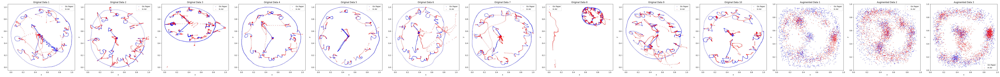

Epoch 31/300: 100%|██████████| 77/77 [00:01<00:00, 54.16batch/s, Total Loss=0.00439, Reconstruction Loss=0.00183, KL Loss=0.255]


Epoch 31: Total Loss = 0.004730, Reconstruction Loss = 0.002151, KL Divergence Loss = 0.257897
MAE = 0.270226, MSE = 0.107165, NRMSE = 0.324154


Epoch 32/300: 100%|██████████| 77/77 [00:01<00:00, 64.17batch/s, Total Loss=0.00415, Reconstruction Loss=0.00167, KL Loss=0.248]


Epoch 32: Total Loss = 0.004771, Reconstruction Loss = 0.002165, KL Divergence Loss = 0.260583
MAE = 0.267449, MSE = 0.104763, NRMSE = 0.320479


Epoch 33/300: 100%|██████████| 77/77 [00:01<00:00, 61.03batch/s, Total Loss=0.00472, Reconstruction Loss=0.00202, KL Loss=0.27] 


Epoch 33: Total Loss = 0.005332, Reconstruction Loss = 0.002524, KL Divergence Loss = 0.280828
MAE = 0.270993, MSE = 0.107400, NRMSE = 0.324446


Epoch 34/300: 100%|██████████| 77/77 [00:01<00:00, 55.96batch/s, Total Loss=0.004, Reconstruction Loss=0.00161, KL Loss=0.239]  


Epoch 34: Total Loss = 0.004469, Reconstruction Loss = 0.001945, KL Divergence Loss = 0.252440
MAE = 0.264639, MSE = 0.102452, NRMSE = 0.316910


Epoch 35/300: 100%|██████████| 77/77 [00:01<00:00, 51.38batch/s, Total Loss=0.00397, Reconstruction Loss=0.00158, KL Loss=0.239]


Epoch 35: Total Loss = 0.004304, Reconstruction Loss = 0.001902, KL Divergence Loss = 0.240254
MAE = 0.262604, MSE = 0.100848, NRMSE = 0.314582


Epoch 36/300: 100%|██████████| 77/77 [00:01<00:00, 44.27batch/s, Total Loss=0.00386, Reconstruction Loss=0.00151, KL Loss=0.235]


Epoch 36: Total Loss = 0.004072, Reconstruction Loss = 0.001767, KL Divergence Loss = 0.230540
MAE = 0.259861, MSE = 0.098792, NRMSE = 0.311466


Epoch 37/300: 100%|██████████| 77/77 [00:02<00:00, 31.21batch/s, Total Loss=0.0036, Reconstruction Loss=0.00138, KL Loss=0.222] 


Epoch 37: Total Loss = 0.004358, Reconstruction Loss = 0.001845, KL Divergence Loss = 0.251276
MAE = 0.261669, MSE = 0.100130, NRMSE = 0.313581


Epoch 38/300: 100%|██████████| 77/77 [00:01<00:00, 42.20batch/s, Total Loss=0.00362, Reconstruction Loss=0.00139, KL Loss=0.223]


Epoch 38: Total Loss = 0.003890, Reconstruction Loss = 0.001649, KL Divergence Loss = 0.224013
MAE = 0.258367, MSE = 0.097570, NRMSE = 0.309546


Epoch 39/300: 100%|██████████| 77/77 [00:01<00:00, 45.85batch/s, Total Loss=0.00349, Reconstruction Loss=0.0014, KL Loss=0.209] 


Epoch 39: Total Loss = 0.003697, Reconstruction Loss = 0.001525, KL Divergence Loss = 0.217146
MAE = 0.256305, MSE = 0.096073, NRMSE = 0.307399


Epoch 40/300: 100%|██████████| 77/77 [00:01<00:00, 43.86batch/s, Total Loss=0.00365, Reconstruction Loss=0.00138, KL Loss=0.227]


Epoch 40: Total Loss = 0.004319, Reconstruction Loss = 0.001777, KL Divergence Loss = 0.254184
MAE = 0.259115, MSE = 0.098348, NRMSE = 0.310936


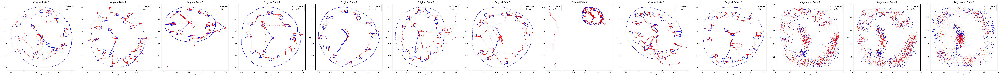

Epoch 41/300: 100%|██████████| 77/77 [00:01<00:00, 44.81batch/s, Total Loss=0.00326, Reconstruction Loss=0.00122, KL Loss=0.204]


Epoch 41: Total Loss = 0.003611, Reconstruction Loss = 0.001479, KL Divergence Loss = 0.213218
MAE = 0.256151, MSE = 0.095909, NRMSE = 0.307117


Epoch 42/300: 100%|██████████| 77/77 [00:01<00:00, 44.76batch/s, Total Loss=0.00406, Reconstruction Loss=0.00138, KL Loss=0.268]


Epoch 42: Total Loss = 0.003942, Reconstruction Loss = 0.001688, KL Divergence Loss = 0.225409
MAE = 0.255632, MSE = 0.095769, NRMSE = 0.307049


Epoch 43/300: 100%|██████████| 77/77 [00:01<00:00, 52.42batch/s, Total Loss=0.00318, Reconstruction Loss=0.00107, KL Loss=0.211]


Epoch 43: Total Loss = 0.003730, Reconstruction Loss = 0.001401, KL Divergence Loss = 0.232945
MAE = 0.254972, MSE = 0.095126, NRMSE = 0.306004


Epoch 44/300: 100%|██████████| 77/77 [00:01<00:00, 48.21batch/s, Total Loss=0.00304, Reconstruction Loss=0.00112, KL Loss=0.193]


Epoch 44: Total Loss = 0.003306, Reconstruction Loss = 0.001252, KL Divergence Loss = 0.205347
MAE = 0.254852, MSE = 0.095147, NRMSE = 0.306057


Epoch 45/300: 100%|██████████| 77/77 [00:01<00:00, 45.52batch/s, Total Loss=0.00322, Reconstruction Loss=0.00105, KL Loss=0.217]


Epoch 45: Total Loss = 0.003305, Reconstruction Loss = 0.001254, KL Divergence Loss = 0.205123
MAE = 0.255195, MSE = 0.095415, NRMSE = 0.306545


Epoch 46/300: 100%|██████████| 77/77 [00:01<00:00, 42.73batch/s, Total Loss=0.00299, Reconstruction Loss=0.00111, KL Loss=0.188] 


Epoch 46: Total Loss = 0.003170, Reconstruction Loss = 0.001106, KL Divergence Loss = 0.206402
MAE = 0.253787, MSE = 0.094408, NRMSE = 0.304988


Epoch 47/300: 100%|██████████| 77/77 [00:01<00:00, 52.76batch/s, Total Loss=0.0029, Reconstruction Loss=0.00103, KL Loss=0.187]  


Epoch 47: Total Loss = 0.003024, Reconstruction Loss = 0.001093, KL Divergence Loss = 0.193155
MAE = 0.252732, MSE = 0.093585, NRMSE = 0.303775


Epoch 48/300: 100%|██████████| 77/77 [00:01<00:00, 55.75batch/s, Total Loss=0.00264, Reconstruction Loss=0.000821, KL Loss=0.182]


Epoch 48: Total Loss = 0.002880, Reconstruction Loss = 0.001035, KL Divergence Loss = 0.184486
MAE = 0.252641, MSE = 0.093449, NRMSE = 0.303619


Epoch 49/300: 100%|██████████| 77/77 [00:01<00:00, 52.55batch/s, Total Loss=0.00305, Reconstruction Loss=0.00125, KL Loss=0.18]  


Epoch 49: Total Loss = 0.003162, Reconstruction Loss = 0.001187, KL Divergence Loss = 0.197535
MAE = 0.251580, MSE = 0.092475, NRMSE = 0.301981


Epoch 50/300: 100%|██████████| 77/77 [00:01<00:00, 55.51batch/s, Total Loss=0.00279, Reconstruction Loss=0.000778, KL Loss=0.201]


Epoch 50: Total Loss = 0.002789, Reconstruction Loss = 0.000960, KL Divergence Loss = 0.182885
MAE = 0.250425, MSE = 0.091829, NRMSE = 0.301166


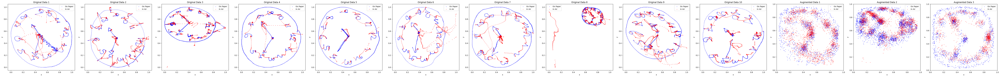

Epoch 51/300: 100%|██████████| 77/77 [00:01<00:00, 49.71batch/s, Total Loss=0.00284, Reconstruction Loss=0.000891, KL Loss=0.195]


Epoch 51: Total Loss = 0.003265, Reconstruction Loss = 0.001164, KL Divergence Loss = 0.210100
MAE = 0.248204, MSE = 0.090228, NRMSE = 0.298510


Epoch 52/300: 100%|██████████| 77/77 [00:01<00:00, 50.65batch/s, Total Loss=0.00284, Reconstruction Loss=0.000794, KL Loss=0.205]


Epoch 52: Total Loss = 0.002875, Reconstruction Loss = 0.000973, KL Divergence Loss = 0.190242
MAE = 0.248109, MSE = 0.090229, NRMSE = 0.298468


Epoch 53/300: 100%|██████████| 77/77 [00:01<00:00, 53.66batch/s, Total Loss=0.00343, Reconstruction Loss=0.00174, KL Loss=0.17]  


Epoch 53: Total Loss = 0.002674, Reconstruction Loss = 0.000884, KL Divergence Loss = 0.179070
MAE = 0.248835, MSE = 0.090815, NRMSE = 0.299540


Epoch 54/300: 100%|██████████| 77/77 [00:01<00:00, 53.94batch/s, Total Loss=0.00241, Reconstruction Loss=0.000712, KL Loss=0.17] 


Epoch 54: Total Loss = 0.002732, Reconstruction Loss = 0.000860, KL Divergence Loss = 0.187181
MAE = 0.250170, MSE = 0.091697, NRMSE = 0.301018


Epoch 55/300: 100%|██████████| 77/77 [00:01<00:00, 53.57batch/s, Total Loss=0.00272, Reconstruction Loss=0.000763, KL Loss=0.195]


Epoch 55: Total Loss = 0.002925, Reconstruction Loss = 0.001013, KL Divergence Loss = 0.191175
MAE = 0.252523, MSE = 0.093649, NRMSE = 0.304278


Epoch 56/300: 100%|██████████| 77/77 [00:01<00:00, 50.90batch/s, Total Loss=0.0037, Reconstruction Loss=0.0014, KL Loss=0.23]    


Epoch 56: Total Loss = 0.003059, Reconstruction Loss = 0.001256, KL Divergence Loss = 0.180336
MAE = 0.243967, MSE = 0.087282, NRMSE = 0.294079


Epoch 57/300: 100%|██████████| 77/77 [00:01<00:00, 54.46batch/s, Total Loss=0.00282, Reconstruction Loss=0.000863, KL Loss=0.196]


Epoch 57: Total Loss = 0.003632, Reconstruction Loss = 0.001398, KL Divergence Loss = 0.223317
MAE = 0.246776, MSE = 0.089336, NRMSE = 0.297630


Epoch 58/300: 100%|██████████| 77/77 [00:01<00:00, 55.60batch/s, Total Loss=0.00233, Reconstruction Loss=0.000634, KL Loss=0.169]


Epoch 58: Total Loss = 0.002600, Reconstruction Loss = 0.000841, KL Divergence Loss = 0.175895
MAE = 0.247526, MSE = 0.089983, NRMSE = 0.298579


Epoch 59/300: 100%|██████████| 77/77 [00:01<00:00, 54.34batch/s, Total Loss=0.00223, Reconstruction Loss=0.000694, KL Loss=0.154]


Epoch 59: Total Loss = 0.002349, Reconstruction Loss = 0.000754, KL Divergence Loss = 0.159477
MAE = 0.247392, MSE = 0.090263, NRMSE = 0.299014


Epoch 60/300: 100%|██████████| 77/77 [00:01<00:00, 54.30batch/s, Total Loss=0.00205, Reconstruction Loss=0.000546, KL Loss=0.15] 


Epoch 60: Total Loss = 0.002242, Reconstruction Loss = 0.000720, KL Divergence Loss = 0.152238
MAE = 0.248537, MSE = 0.090816, NRMSE = 0.300010


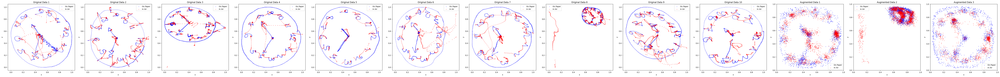

Epoch 61/300: 100%|██████████| 77/77 [00:01<00:00, 43.65batch/s, Total Loss=0.00216, Reconstruction Loss=0.000603, KL Loss=0.156]


Epoch 61: Total Loss = 0.002287, Reconstruction Loss = 0.000746, KL Divergence Loss = 0.154062
MAE = 0.250147, MSE = 0.092348, NRMSE = 0.302561


Epoch 62/300: 100%|██████████| 77/77 [00:01<00:00, 48.97batch/s, Total Loss=0.00239, Reconstruction Loss=0.000569, KL Loss=0.182]


Epoch 62: Total Loss = 0.002281, Reconstruction Loss = 0.000733, KL Divergence Loss = 0.154824
MAE = 0.249425, MSE = 0.091841, NRMSE = 0.301829


Epoch 63/300: 100%|██████████| 77/77 [00:01<00:00, 48.60batch/s, Total Loss=0.00203, Reconstruction Loss=0.000512, KL Loss=0.152]


Epoch 63: Total Loss = 0.002221, Reconstruction Loss = 0.000647, KL Divergence Loss = 0.157390
MAE = 0.250628, MSE = 0.092710, NRMSE = 0.303238


Epoch 64/300: 100%|██████████| 77/77 [00:01<00:00, 52.21batch/s, Total Loss=0.00191, Reconstruction Loss=0.000495, KL Loss=0.142]


Epoch 64: Total Loss = 0.002050, Reconstruction Loss = 0.000595, KL Divergence Loss = 0.145472
MAE = 0.251404, MSE = 0.093264, NRMSE = 0.304080


Epoch 65/300: 100%|██████████| 77/77 [00:01<00:00, 50.56batch/s, Total Loss=0.00191, Reconstruction Loss=0.00052, KL Loss=0.139] 


Epoch 65: Total Loss = 0.001963, Reconstruction Loss = 0.000587, KL Divergence Loss = 0.137584
MAE = 0.252145, MSE = 0.094050, NRMSE = 0.305363


Epoch 66/300: 100%|██████████| 77/77 [00:01<00:00, 53.80batch/s, Total Loss=0.00183, Reconstruction Loss=0.00046, KL Loss=0.137] 


Epoch 66: Total Loss = 0.001935, Reconstruction Loss = 0.000583, KL Divergence Loss = 0.135188
MAE = 0.253354, MSE = 0.094748, NRMSE = 0.306597


Epoch 67/300: 100%|██████████| 77/77 [00:01<00:00, 49.68batch/s, Total Loss=0.00185, Reconstruction Loss=0.000495, KL Loss=0.136]


Epoch 67: Total Loss = 0.001903, Reconstruction Loss = 0.000558, KL Divergence Loss = 0.134512
MAE = 0.253525, MSE = 0.095024, NRMSE = 0.307054


Epoch 68/300: 100%|██████████| 77/77 [00:01<00:00, 54.52batch/s, Total Loss=0.00187, Reconstruction Loss=0.000497, KL Loss=0.138]


Epoch 68: Total Loss = 0.001956, Reconstruction Loss = 0.000576, KL Divergence Loss = 0.137962
MAE = 0.252480, MSE = 0.094547, NRMSE = 0.306320


Epoch 69/300: 100%|██████████| 77/77 [00:01<00:00, 50.61batch/s, Total Loss=0.00274, Reconstruction Loss=0.000611, KL Loss=0.213]


Epoch 69: Total Loss = 0.002259, Reconstruction Loss = 0.000744, KL Divergence Loss = 0.151552
MAE = 0.251924, MSE = 0.093989, NRMSE = 0.305544


Epoch 70/300: 100%|██████████| 77/77 [00:01<00:00, 52.78batch/s, Total Loss=0.00187, Reconstruction Loss=0.000528, KL Loss=0.134]


Epoch 70: Total Loss = 0.002189, Reconstruction Loss = 0.000611, KL Divergence Loss = 0.157777
MAE = 0.251331, MSE = 0.093760, NRMSE = 0.305097


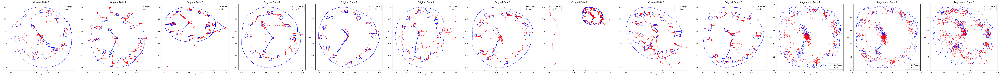

Epoch 71/300: 100%|██████████| 77/77 [00:01<00:00, 50.04batch/s, Total Loss=0.00171, Reconstruction Loss=0.00039, KL Loss=0.132] 


Epoch 71: Total Loss = 0.001857, Reconstruction Loss = 0.000528, KL Divergence Loss = 0.132941
MAE = 0.252871, MSE = 0.094842, NRMSE = 0.306794


Epoch 72/300: 100%|██████████| 77/77 [00:01<00:00, 48.26batch/s, Total Loss=0.00179, Reconstruction Loss=0.000403, KL Loss=0.138]


Epoch 72: Total Loss = 0.001812, Reconstruction Loss = 0.000519, KL Divergence Loss = 0.129334
MAE = 0.252353, MSE = 0.094384, NRMSE = 0.306115


Epoch 73/300: 100%|██████████| 77/77 [00:01<00:00, 53.22batch/s, Total Loss=0.00166, Reconstruction Loss=0.000405, KL Loss=0.126]


Epoch 73: Total Loss = 0.001792, Reconstruction Loss = 0.000494, KL Divergence Loss = 0.129797
MAE = 0.253377, MSE = 0.095171, NRMSE = 0.307376


Epoch 74/300: 100%|██████████| 77/77 [00:01<00:00, 45.91batch/s, Total Loss=0.00187, Reconstruction Loss=0.000411, KL Loss=0.146]


Epoch 74: Total Loss = 0.001836, Reconstruction Loss = 0.000524, KL Divergence Loss = 0.131227
MAE = 0.254662, MSE = 0.096165, NRMSE = 0.309035


Epoch 75/300: 100%|██████████| 77/77 [00:01<00:00, 48.38batch/s, Total Loss=0.00167, Reconstruction Loss=0.000417, KL Loss=0.125]


Epoch 75: Total Loss = 0.001760, Reconstruction Loss = 0.000487, KL Divergence Loss = 0.127296
MAE = 0.253316, MSE = 0.095573, NRMSE = 0.308086


Epoch 76/300: 100%|██████████| 77/77 [00:01<00:00, 52.13batch/s, Total Loss=0.00162, Reconstruction Loss=0.000432, KL Loss=0.119]


Epoch 76: Total Loss = 0.001702, Reconstruction Loss = 0.000465, KL Divergence Loss = 0.123635
MAE = 0.255136, MSE = 0.096764, NRMSE = 0.309966


Epoch 77/300: 100%|██████████| 77/77 [00:01<00:00, 52.08batch/s, Total Loss=0.00172, Reconstruction Loss=0.00043, KL Loss=0.129] 


Epoch 77: Total Loss = 0.001966, Reconstruction Loss = 0.000610, KL Divergence Loss = 0.135608
MAE = 0.256003, MSE = 0.097917, NRMSE = 0.311884


Epoch 78/300: 100%|██████████| 77/77 [00:01<00:00, 54.03batch/s, Total Loss=0.00223, Reconstruction Loss=0.000643, KL Loss=0.159]


Epoch 78: Total Loss = 0.001794, Reconstruction Loss = 0.000553, KL Divergence Loss = 0.124057
MAE = 0.255777, MSE = 0.097234, NRMSE = 0.310924


Epoch 79/300: 100%|██████████| 77/77 [00:01<00:00, 52.20batch/s, Total Loss=0.00162, Reconstruction Loss=0.000392, KL Loss=0.123]


Epoch 79: Total Loss = 0.001997, Reconstruction Loss = 0.000558, KL Divergence Loss = 0.143914
MAE = 0.255657, MSE = 0.097546, NRMSE = 0.311286


Epoch 80/300: 100%|██████████| 77/77 [00:01<00:00, 52.34batch/s, Total Loss=0.00158, Reconstruction Loss=0.000414, KL Loss=0.117]


Epoch 80: Total Loss = 0.001643, Reconstruction Loss = 0.000456, KL Divergence Loss = 0.118759
MAE = 0.256007, MSE = 0.097688, NRMSE = 0.311527


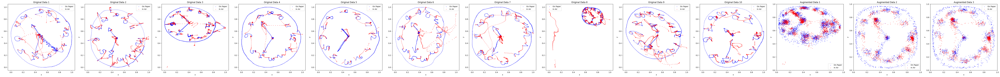

Epoch 81/300: 100%|██████████| 77/77 [00:01<00:00, 52.82batch/s, Total Loss=0.00232, Reconstruction Loss=0.000522, KL Loss=0.18] 


Epoch 81: Total Loss = 0.001818, Reconstruction Loss = 0.000570, KL Divergence Loss = 0.124835
MAE = 0.257035, MSE = 0.098104, NRMSE = 0.312368


Epoch 82/300: 100%|██████████| 77/77 [00:01<00:00, 50.85batch/s, Total Loss=0.00196, Reconstruction Loss=0.000672, KL Loss=0.129]


Epoch 82: Total Loss = 0.003471, Reconstruction Loss = 0.001757, KL Divergence Loss = 0.171365
MAE = 0.251887, MSE = 0.094199, NRMSE = 0.306138


Epoch 83/300: 100%|██████████| 77/77 [00:01<00:00, 54.18batch/s, Total Loss=0.00196, Reconstruction Loss=0.000714, KL Loss=0.125]


Epoch 83: Total Loss = 0.001836, Reconstruction Loss = 0.000588, KL Divergence Loss = 0.124840
MAE = 0.253150, MSE = 0.095071, NRMSE = 0.307458


Epoch 84/300: 100%|██████████| 77/77 [00:01<00:00, 53.29batch/s, Total Loss=0.00166, Reconstruction Loss=0.000403, KL Loss=0.126]


Epoch 84: Total Loss = 0.002024, Reconstruction Loss = 0.000550, KL Divergence Loss = 0.147398
MAE = 0.253092, MSE = 0.095387, NRMSE = 0.307825


Epoch 85/300: 100%|██████████| 77/77 [00:01<00:00, 51.50batch/s, Total Loss=0.00156, Reconstruction Loss=0.000401, KL Loss=0.116]


Epoch 85: Total Loss = 0.001654, Reconstruction Loss = 0.000449, KL Divergence Loss = 0.120509
MAE = 0.254647, MSE = 0.096688, NRMSE = 0.309903


Epoch 86/300: 100%|██████████| 77/77 [00:01<00:00, 54.03batch/s, Total Loss=0.0019, Reconstruction Loss=0.000431, KL Loss=0.147] 


Epoch 86: Total Loss = 0.002313, Reconstruction Loss = 0.000729, KL Divergence Loss = 0.158355
MAE = 0.253343, MSE = 0.095690, NRMSE = 0.308360


Epoch 87/300: 100%|██████████| 77/77 [00:01<00:00, 51.17batch/s, Total Loss=0.0016, Reconstruction Loss=0.00039, KL Loss=0.121]  


Epoch 87: Total Loss = 0.001731, Reconstruction Loss = 0.000440, KL Divergence Loss = 0.129064
MAE = 0.252584, MSE = 0.095503, NRMSE = 0.308043


Epoch 88/300: 100%|██████████| 77/77 [00:01<00:00, 54.12batch/s, Total Loss=0.00154, Reconstruction Loss=0.000367, KL Loss=0.118]


Epoch 88: Total Loss = 0.001615, Reconstruction Loss = 0.000418, KL Divergence Loss = 0.119690
MAE = 0.255513, MSE = 0.097410, NRMSE = 0.311053


Epoch 89/300: 100%|██████████| 77/77 [00:01<00:00, 52.04batch/s, Total Loss=0.00156, Reconstruction Loss=0.000377, KL Loss=0.118]


Epoch 89: Total Loss = 0.001607, Reconstruction Loss = 0.000415, KL Divergence Loss = 0.119235
MAE = 0.256923, MSE = 0.098394, NRMSE = 0.312595


Epoch 90/300: 100%|██████████| 77/77 [00:01<00:00, 54.58batch/s, Total Loss=0.00145, Reconstruction Loss=0.000328, KL Loss=0.112]


Epoch 90: Total Loss = 0.001527, Reconstruction Loss = 0.000391, KL Divergence Loss = 0.113544
MAE = 0.255427, MSE = 0.097244, NRMSE = 0.310883


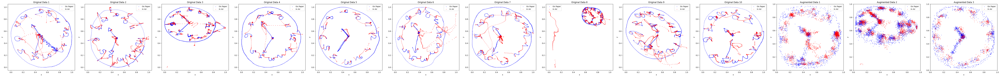

Epoch 91/300: 100%|██████████| 77/77 [00:01<00:00, 53.78batch/s, Total Loss=0.00165, Reconstruction Loss=0.000412, KL Loss=0.124]


Epoch 91: Total Loss = 0.002304, Reconstruction Loss = 0.000879, KL Divergence Loss = 0.142475
MAE = 0.256373, MSE = 0.097862, NRMSE = 0.311696


Epoch 92/300: 100%|██████████| 77/77 [00:01<00:00, 51.18batch/s, Total Loss=0.00153, Reconstruction Loss=0.000388, KL Loss=0.114]


Epoch 92: Total Loss = 0.001601, Reconstruction Loss = 0.000426, KL Divergence Loss = 0.117460
MAE = 0.256120, MSE = 0.098080, NRMSE = 0.312148


Epoch 93/300: 100%|██████████| 77/77 [00:01<00:00, 52.91batch/s, Total Loss=0.00148, Reconstruction Loss=0.000305, KL Loss=0.117]


Epoch 93: Total Loss = 0.001617, Reconstruction Loss = 0.000432, KL Divergence Loss = 0.118491
MAE = 0.258094, MSE = 0.099349, NRMSE = 0.314235


Epoch 94/300: 100%|██████████| 77/77 [00:01<00:00, 51.88batch/s, Total Loss=0.00155, Reconstruction Loss=0.000364, KL Loss=0.119]


Epoch 94: Total Loss = 0.001556, Reconstruction Loss = 0.000393, KL Divergence Loss = 0.116258
MAE = 0.258882, MSE = 0.099918, NRMSE = 0.315119


Epoch 95/300: 100%|██████████| 77/77 [00:01<00:00, 54.32batch/s, Total Loss=0.00144, Reconstruction Loss=0.000331, KL Loss=0.111]


Epoch 95: Total Loss = 0.001540, Reconstruction Loss = 0.000382, KL Divergence Loss = 0.115750
MAE = 0.258516, MSE = 0.099618, NRMSE = 0.314653


Epoch 96/300: 100%|██████████| 77/77 [00:01<00:00, 51.95batch/s, Total Loss=0.00174, Reconstruction Loss=0.000401, KL Loss=0.134]


Epoch 96: Total Loss = 0.001716, Reconstruction Loss = 0.000488, KL Divergence Loss = 0.122831
MAE = 0.260683, MSE = 0.101635, NRMSE = 0.317607


Epoch 97/300: 100%|██████████| 77/77 [00:01<00:00, 53.20batch/s, Total Loss=0.0025, Reconstruction Loss=0.00123, KL Loss=0.127]  


Epoch 97: Total Loss = 0.001757, Reconstruction Loss = 0.000570, KL Divergence Loss = 0.118663
MAE = 0.259221, MSE = 0.100313, NRMSE = 0.315598


Epoch 98/300: 100%|██████████| 77/77 [00:01<00:00, 50.49batch/s, Total Loss=0.00174, Reconstruction Loss=0.000401, KL Loss=0.133]


Epoch 98: Total Loss = 0.002726, Reconstruction Loss = 0.001186, KL Divergence Loss = 0.154029
MAE = 0.259161, MSE = 0.100467, NRMSE = 0.316039


Epoch 99/300: 100%|██████████| 77/77 [00:01<00:00, 53.80batch/s, Total Loss=0.00172, Reconstruction Loss=0.000399, KL Loss=0.132]


Epoch 99: Total Loss = 0.002270, Reconstruction Loss = 0.000706, KL Divergence Loss = 0.156385
MAE = 0.257274, MSE = 0.099443, NRMSE = 0.314605


Epoch 100/300: 100%|██████████| 77/77 [00:01<00:00, 50.13batch/s, Total Loss=0.00154, Reconstruction Loss=0.000387, KL Loss=0.115]


Epoch 100: Total Loss = 0.001649, Reconstruction Loss = 0.000433, KL Divergence Loss = 0.121600
MAE = 0.258887, MSE = 0.100274, NRMSE = 0.315766


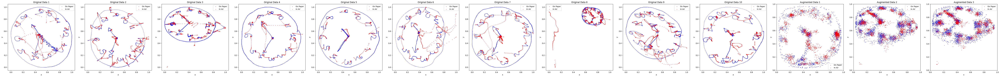

Epoch 101/300: 100%|██████████| 77/77 [00:01<00:00, 54.17batch/s, Total Loss=0.00144, Reconstruction Loss=0.000332, KL Loss=0.111]


Epoch 101: Total Loss = 0.001528, Reconstruction Loss = 0.000405, KL Divergence Loss = 0.112229
MAE = 0.258932, MSE = 0.100167, NRMSE = 0.315692


Epoch 102/300: 100%|██████████| 77/77 [00:01<00:00, 53.35batch/s, Total Loss=0.00143, Reconstruction Loss=0.000331, KL Loss=0.11] 


Epoch 102: Total Loss = 0.001486, Reconstruction Loss = 0.000387, KL Divergence Loss = 0.109980
MAE = 0.259337, MSE = 0.100708, NRMSE = 0.316552


Epoch 103/300: 100%|██████████| 77/77 [00:01<00:00, 60.09batch/s, Total Loss=0.00175, Reconstruction Loss=0.000437, KL Loss=0.131]


Epoch 103: Total Loss = 0.001697, Reconstruction Loss = 0.000555, KL Divergence Loss = 0.114197
MAE = 0.263520, MSE = 0.103875, NRMSE = 0.321303


Epoch 104/300: 100%|██████████| 77/77 [00:01<00:00, 64.18batch/s, Total Loss=0.00147, Reconstruction Loss=0.000358, KL Loss=0.111]


Epoch 104: Total Loss = 0.001638, Reconstruction Loss = 0.000433, KL Divergence Loss = 0.120518
MAE = 0.261050, MSE = 0.102059, NRMSE = 0.318426


Epoch 105/300: 100%|██████████| 77/77 [00:01<00:00, 65.87batch/s, Total Loss=0.00145, Reconstruction Loss=0.000352, KL Loss=0.11] 


Epoch 105: Total Loss = 0.001481, Reconstruction Loss = 0.000380, KL Divergence Loss = 0.110054
MAE = 0.260893, MSE = 0.102132, NRMSE = 0.318587


Epoch 106/300: 100%|██████████| 77/77 [00:01<00:00, 49.75batch/s, Total Loss=0.00141, Reconstruction Loss=0.0003, KL Loss=0.111]  


Epoch 106: Total Loss = 0.001459, Reconstruction Loss = 0.000367, KL Divergence Loss = 0.109132
MAE = 0.260816, MSE = 0.101762, NRMSE = 0.318141


Epoch 107/300: 100%|██████████| 77/77 [00:01<00:00, 41.24batch/s, Total Loss=0.0014, Reconstruction Loss=0.000329, KL Loss=0.107] 


Epoch 107: Total Loss = 0.001436, Reconstruction Loss = 0.000363, KL Divergence Loss = 0.107226
MAE = 0.261411, MSE = 0.102294, NRMSE = 0.318849


Epoch 108/300: 100%|██████████| 77/77 [00:01<00:00, 43.07batch/s, Total Loss=0.00135, Reconstruction Loss=0.000292, KL Loss=0.106]


Epoch 108: Total Loss = 0.001414, Reconstruction Loss = 0.000350, KL Divergence Loss = 0.106368
MAE = 0.261606, MSE = 0.102414, NRMSE = 0.319196


Epoch 109/300: 100%|██████████| 77/77 [00:01<00:00, 42.31batch/s, Total Loss=0.00143, Reconstruction Loss=0.000316, KL Loss=0.112]


Epoch 109: Total Loss = 0.001592, Reconstruction Loss = 0.000446, KL Divergence Loss = 0.114649
MAE = 0.261914, MSE = 0.102724, NRMSE = 0.319565


Epoch 110/300: 100%|██████████| 77/77 [00:01<00:00, 44.30batch/s, Total Loss=0.00246, Reconstruction Loss=0.00067, KL Loss=0.179] 


Epoch 110: Total Loss = 0.001897, Reconstruction Loss = 0.000653, KL Divergence Loss = 0.124423
MAE = 0.263606, MSE = 0.104129, NRMSE = 0.321961


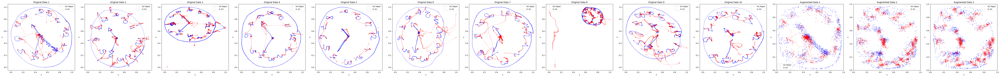

Epoch 111/300: 100%|██████████| 77/77 [00:01<00:00, 46.33batch/s, Total Loss=0.00157, Reconstruction Loss=0.000351, KL Loss=0.122]


Epoch 111: Total Loss = 0.002020, Reconstruction Loss = 0.000582, KL Divergence Loss = 0.143828
MAE = 0.259070, MSE = 0.100747, NRMSE = 0.316618


Epoch 112/300: 100%|██████████| 77/77 [00:01<00:00, 49.38batch/s, Total Loss=0.00269, Reconstruction Loss=0.00114, KL Loss=0.156] 


Epoch 112: Total Loss = 0.002426, Reconstruction Loss = 0.001123, KL Divergence Loss = 0.130361
MAE = 0.258612, MSE = 0.100251, NRMSE = 0.315749


Epoch 113/300: 100%|██████████| 77/77 [00:01<00:00, 45.22batch/s, Total Loss=0.00169, Reconstruction Loss=0.000404, KL Loss=0.128]


Epoch 113: Total Loss = 0.002603, Reconstruction Loss = 0.001013, KL Divergence Loss = 0.158965
MAE = 0.258895, MSE = 0.100264, NRMSE = 0.315848


Epoch 114/300: 100%|██████████| 77/77 [00:01<00:00, 49.37batch/s, Total Loss=0.00229, Reconstruction Loss=0.000566, KL Loss=0.173]


Epoch 114: Total Loss = 0.001918, Reconstruction Loss = 0.000579, KL Divergence Loss = 0.133937
MAE = 0.259521, MSE = 0.101006, NRMSE = 0.317112


Epoch 115/300: 100%|██████████| 77/77 [00:01<00:00, 44.66batch/s, Total Loss=0.00149, Reconstruction Loss=0.000356, KL Loss=0.114]


Epoch 115: Total Loss = 0.001850, Reconstruction Loss = 0.000481, KL Divergence Loss = 0.136869
MAE = 0.258550, MSE = 0.099894, NRMSE = 0.315383


Epoch 116/300: 100%|██████████| 77/77 [00:01<00:00, 47.14batch/s, Total Loss=0.00143, Reconstruction Loss=0.00035, KL Loss=0.108] 


Epoch 116: Total Loss = 0.001525, Reconstruction Loss = 0.000416, KL Divergence Loss = 0.110936
MAE = 0.259819, MSE = 0.100941, NRMSE = 0.316947


Epoch 117/300: 100%|██████████| 77/77 [00:01<00:00, 51.72batch/s, Total Loss=0.00138, Reconstruction Loss=0.000324, KL Loss=0.106]


Epoch 117: Total Loss = 0.001459, Reconstruction Loss = 0.000386, KL Divergence Loss = 0.107364
MAE = 0.260663, MSE = 0.101452, NRMSE = 0.317778


Epoch 118/300: 100%|██████████| 77/77 [00:01<00:00, 54.20batch/s, Total Loss=0.00134, Reconstruction Loss=0.000316, KL Loss=0.103]


Epoch 118: Total Loss = 0.001416, Reconstruction Loss = 0.000366, KL Divergence Loss = 0.104984
MAE = 0.260694, MSE = 0.101767, NRMSE = 0.318295


Epoch 119/300: 100%|██████████| 77/77 [00:01<00:00, 49.86batch/s, Total Loss=0.00134, Reconstruction Loss=0.000317, KL Loss=0.102] 


Epoch 119: Total Loss = 0.001392, Reconstruction Loss = 0.000358, KL Divergence Loss = 0.103361
MAE = 0.260327, MSE = 0.101737, NRMSE = 0.318195


Epoch 120/300: 100%|██████████| 77/77 [00:01<00:00, 53.86batch/s, Total Loss=0.0013, Reconstruction Loss=0.000277, KL Loss=0.103]  


Epoch 120: Total Loss = 0.001371, Reconstruction Loss = 0.000339, KL Divergence Loss = 0.103208
MAE = 0.262402, MSE = 0.103042, NRMSE = 0.320329


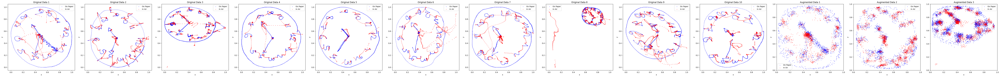

Epoch 121/300: 100%|██████████| 77/77 [00:01<00:00, 50.28batch/s, Total Loss=0.0013, Reconstruction Loss=0.000281, KL Loss=0.102] 


Epoch 121: Total Loss = 0.001389, Reconstruction Loss = 0.000332, KL Divergence Loss = 0.105633
MAE = 0.263808, MSE = 0.103908, NRMSE = 0.321606


Epoch 122/300: 100%|██████████| 77/77 [00:01<00:00, 51.65batch/s, Total Loss=0.0013, Reconstruction Loss=0.000289, KL Loss=0.101]  


Epoch 122: Total Loss = 0.001355, Reconstruction Loss = 0.000340, KL Divergence Loss = 0.101502
MAE = 0.262580, MSE = 0.103460, NRMSE = 0.320805


Epoch 123/300: 100%|██████████| 77/77 [00:01<00:00, 51.33batch/s, Total Loss=0.00156, Reconstruction Loss=0.00033, KL Loss=0.123] 


Epoch 123: Total Loss = 0.001886, Reconstruction Loss = 0.000590, KL Divergence Loss = 0.129673
MAE = 0.261087, MSE = 0.102224, NRMSE = 0.319036


Epoch 124/300: 100%|██████████| 77/77 [00:01<00:00, 49.30batch/s, Total Loss=0.00147, Reconstruction Loss=0.000366, KL Loss=0.11] 


Epoch 124: Total Loss = 0.001484, Reconstruction Loss = 0.000364, KL Divergence Loss = 0.111922
MAE = 0.261366, MSE = 0.102851, NRMSE = 0.320014


Epoch 125/300: 100%|██████████| 77/77 [00:01<00:00, 46.48batch/s, Total Loss=0.00134, Reconstruction Loss=0.000288, KL Loss=0.106]


Epoch 125: Total Loss = 0.001554, Reconstruction Loss = 0.000399, KL Divergence Loss = 0.115530
MAE = 0.260199, MSE = 0.101534, NRMSE = 0.318000


Epoch 126/300: 100%|██████████| 77/77 [00:01<00:00, 52.41batch/s, Total Loss=0.00129, Reconstruction Loss=0.000251, KL Loss=0.103]


Epoch 126: Total Loss = 0.001443, Reconstruction Loss = 0.000373, KL Divergence Loss = 0.106982
MAE = 0.261945, MSE = 0.102963, NRMSE = 0.320180


Epoch 127/300: 100%|██████████| 77/77 [00:01<00:00, 48.78batch/s, Total Loss=0.0013, Reconstruction Loss=0.000299, KL Loss=0.1]    


Epoch 127: Total Loss = 0.001342, Reconstruction Loss = 0.000324, KL Divergence Loss = 0.101744
MAE = 0.262169, MSE = 0.103148, NRMSE = 0.320447


Epoch 128/300: 100%|██████████| 77/77 [00:01<00:00, 51.86batch/s, Total Loss=0.00222, Reconstruction Loss=0.0008, KL Loss=0.142]   


Epoch 128: Total Loss = 0.001423, Reconstruction Loss = 0.000396, KL Divergence Loss = 0.102684
MAE = 0.259900, MSE = 0.101568, NRMSE = 0.318224


Epoch 129/300: 100%|██████████| 77/77 [00:01<00:00, 50.28batch/s, Total Loss=0.00142, Reconstruction Loss=0.000303, KL Loss=0.111]


Epoch 129: Total Loss = 0.001778, Reconstruction Loss = 0.000420, KL Divergence Loss = 0.135867
MAE = 0.260888, MSE = 0.102153, NRMSE = 0.318966


Epoch 130/300: 100%|██████████| 77/77 [00:01<00:00, 49.76batch/s, Total Loss=0.00127, Reconstruction Loss=0.000277, KL Loss=0.0995]


Epoch 130: Total Loss = 0.001363, Reconstruction Loss = 0.000328, KL Divergence Loss = 0.103572
MAE = 0.261099, MSE = 0.102498, NRMSE = 0.319577


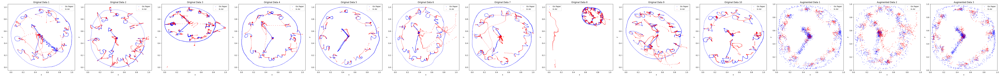

Epoch 131/300: 100%|██████████| 77/77 [00:01<00:00, 51.28batch/s, Total Loss=0.00125, Reconstruction Loss=0.000287, KL Loss=0.0966]


Epoch 131: Total Loss = 0.001304, Reconstruction Loss = 0.000322, KL Divergence Loss = 0.098146
MAE = 0.262004, MSE = 0.102926, NRMSE = 0.320225


Epoch 132/300: 100%|██████████| 77/77 [00:01<00:00, 50.26batch/s, Total Loss=0.00123, Reconstruction Loss=0.000287, KL Loss=0.0946]


Epoch 132: Total Loss = 0.001279, Reconstruction Loss = 0.000311, KL Divergence Loss = 0.096735
MAE = 0.261227, MSE = 0.102793, NRMSE = 0.320072


Epoch 133/300: 100%|██████████| 77/77 [00:01<00:00, 50.28batch/s, Total Loss=0.00174, Reconstruction Loss=0.000358, KL Loss=0.138]


Epoch 133: Total Loss = 0.002539, Reconstruction Loss = 0.000946, KL Divergence Loss = 0.159354
MAE = 0.263517, MSE = 0.103922, NRMSE = 0.321668


Epoch 134/300: 100%|██████████| 77/77 [00:01<00:00, 51.33batch/s, Total Loss=0.00139, Reconstruction Loss=0.000295, KL Loss=0.11] 


Epoch 134: Total Loss = 0.001545, Reconstruction Loss = 0.000374, KL Divergence Loss = 0.117125
MAE = 0.265190, MSE = 0.105516, NRMSE = 0.324067


Epoch 135/300: 100%|██████████| 77/77 [00:01<00:00, 50.26batch/s, Total Loss=0.00129, Reconstruction Loss=0.000251, KL Loss=0.104]


Epoch 135: Total Loss = 0.001381, Reconstruction Loss = 0.000340, KL Divergence Loss = 0.104157
MAE = 0.263481, MSE = 0.104276, NRMSE = 0.322348


Epoch 136/300: 100%|██████████| 77/77 [00:01<00:00, 52.41batch/s, Total Loss=0.00123, Reconstruction Loss=0.000243, KL Loss=0.0984]


Epoch 136: Total Loss = 0.001309, Reconstruction Loss = 0.000315, KL Divergence Loss = 0.099330
MAE = 0.263065, MSE = 0.104007, NRMSE = 0.321842


Epoch 137/300: 100%|██████████| 77/77 [00:01<00:00, 51.83batch/s, Total Loss=0.0014, Reconstruction Loss=0.000322, KL Loss=0.107]  


Epoch 137: Total Loss = 0.001355, Reconstruction Loss = 0.000356, KL Divergence Loss = 0.099866
MAE = 0.263784, MSE = 0.104547, NRMSE = 0.322704


Epoch 138/300: 100%|██████████| 77/77 [00:01<00:00, 53.56batch/s, Total Loss=0.00121, Reconstruction Loss=0.000254, KL Loss=0.0953]


Epoch 138: Total Loss = 0.001301, Reconstruction Loss = 0.000306, KL Divergence Loss = 0.099528
MAE = 0.263540, MSE = 0.104254, NRMSE = 0.322309


Epoch 139/300: 100%|██████████| 77/77 [00:01<00:00, 51.15batch/s, Total Loss=0.0012, Reconstruction Loss=0.000242, KL Loss=0.0956] 


Epoch 139: Total Loss = 0.001253, Reconstruction Loss = 0.000306, KL Divergence Loss = 0.094713
MAE = 0.263453, MSE = 0.104743, NRMSE = 0.323078


Epoch 140/300: 100%|██████████| 77/77 [00:01<00:00, 54.76batch/s, Total Loss=0.0012, Reconstruction Loss=0.000247, KL Loss=0.0949] 


Epoch 140: Total Loss = 0.001228, Reconstruction Loss = 0.000281, KL Divergence Loss = 0.094711
MAE = 0.265248, MSE = 0.105905, NRMSE = 0.324886


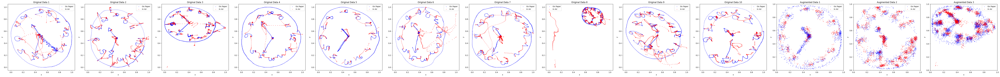

Epoch 141/300: 100%|██████████| 77/77 [00:01<00:00, 51.85batch/s, Total Loss=0.00338, Reconstruction Loss=0.00179, KL Loss=0.159]  


Epoch 141: Total Loss = 0.002943, Reconstruction Loss = 0.001742, KL Divergence Loss = 0.120145
MAE = 0.265889, MSE = 0.106008, NRMSE = 0.325216


Epoch 142/300: 100%|██████████| 77/77 [00:01<00:00, 53.55batch/s, Total Loss=0.00144, Reconstruction Loss=0.000357, KL Loss=0.109]


Epoch 142: Total Loss = 0.002053, Reconstruction Loss = 0.000739, KL Divergence Loss = 0.131339
MAE = 0.261497, MSE = 0.102760, NRMSE = 0.320030


Epoch 143/300: 100%|██████████| 77/77 [00:01<00:00, 52.43batch/s, Total Loss=0.00136, Reconstruction Loss=0.000347, KL Loss=0.101] 


Epoch 143: Total Loss = 0.001434, Reconstruction Loss = 0.000367, KL Divergence Loss = 0.106690
MAE = 0.263106, MSE = 0.104119, NRMSE = 0.322187


Epoch 144/300: 100%|██████████| 77/77 [00:01<00:00, 54.12batch/s, Total Loss=0.00128, Reconstruction Loss=0.000306, KL Loss=0.0972]


Epoch 144: Total Loss = 0.001332, Reconstruction Loss = 0.000326, KL Divergence Loss = 0.100599
MAE = 0.266056, MSE = 0.106195, NRMSE = 0.325345


Epoch 145/300: 100%|██████████| 77/77 [00:01<00:00, 52.97batch/s, Total Loss=0.00127, Reconstruction Loss=0.000263, KL Loss=0.1]  


Epoch 145: Total Loss = 0.001506, Reconstruction Loss = 0.000392, KL Divergence Loss = 0.111451
MAE = 0.265136, MSE = 0.105468, NRMSE = 0.324209


Epoch 146/300: 100%|██████████| 77/77 [00:01<00:00, 52.39batch/s, Total Loss=0.00122, Reconstruction Loss=0.000275, KL Loss=0.0949]


Epoch 146: Total Loss = 0.001281, Reconstruction Loss = 0.000299, KL Divergence Loss = 0.098200
MAE = 0.265010, MSE = 0.105719, NRMSE = 0.324659


Epoch 147/300: 100%|██████████| 77/77 [00:01<00:00, 51.88batch/s, Total Loss=0.00119, Reconstruction Loss=0.000257, KL Loss=0.0933]


Epoch 147: Total Loss = 0.001243, Reconstruction Loss = 0.000296, KL Divergence Loss = 0.094718
MAE = 0.265070, MSE = 0.105521, NRMSE = 0.324319


Epoch 148/300: 100%|██████████| 77/77 [00:01<00:00, 50.26batch/s, Total Loss=0.00118, Reconstruction Loss=0.000256, KL Loss=0.0925]


Epoch 148: Total Loss = 0.001218, Reconstruction Loss = 0.000285, KL Divergence Loss = 0.093231
MAE = 0.265388, MSE = 0.106005, NRMSE = 0.325165


Epoch 149/300: 100%|██████████| 77/77 [00:01<00:00, 53.55batch/s, Total Loss=0.00118, Reconstruction Loss=0.000219, KL Loss=0.0966]


Epoch 149: Total Loss = 0.001208, Reconstruction Loss = 0.000280, KL Divergence Loss = 0.092826
MAE = 0.265366, MSE = 0.105887, NRMSE = 0.324892


Epoch 150/300: 100%|██████████| 77/77 [00:01<00:00, 53.55batch/s, Total Loss=0.00222, Reconstruction Loss=0.000647, KL Loss=0.157] 


Epoch 150: Total Loss = 0.002301, Reconstruction Loss = 0.000986, KL Divergence Loss = 0.131452
MAE = 0.265340, MSE = 0.105336, NRMSE = 0.323936


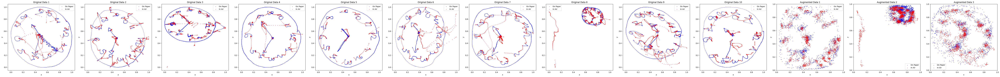

Epoch 151/300: 100%|██████████| 77/77 [00:01<00:00, 47.36batch/s, Total Loss=0.00135, Reconstruction Loss=0.000287, KL Loss=0.106]


Epoch 151: Total Loss = 0.001687, Reconstruction Loss = 0.000459, KL Divergence Loss = 0.122861
MAE = 0.264254, MSE = 0.104647, NRMSE = 0.322875


Epoch 152/300: 100%|██████████| 77/77 [00:01<00:00, 53.55batch/s, Total Loss=0.00124, Reconstruction Loss=0.000243, KL Loss=0.0993]


Epoch 152: Total Loss = 0.001334, Reconstruction Loss = 0.000321, KL Divergence Loss = 0.101240
MAE = 0.262946, MSE = 0.103896, NRMSE = 0.321743


Epoch 153/300: 100%|██████████| 77/77 [00:01<00:00, 50.27batch/s, Total Loss=0.0012, Reconstruction Loss=0.000245, KL Loss=0.0952] 


Epoch 153: Total Loss = 0.001258, Reconstruction Loss = 0.000291, KL Divergence Loss = 0.096703
MAE = 0.265018, MSE = 0.105430, NRMSE = 0.324160


Epoch 154/300: 100%|██████████| 77/77 [00:01<00:00, 53.51batch/s, Total Loss=0.00162, Reconstruction Loss=0.000408, KL Loss=0.121] 


Epoch 154: Total Loss = 0.001546, Reconstruction Loss = 0.000478, KL Divergence Loss = 0.106763
MAE = 0.262490, MSE = 0.103510, NRMSE = 0.321315


Epoch 155/300: 100%|██████████| 77/77 [00:01<00:00, 51.86batch/s, Total Loss=0.00123, Reconstruction Loss=0.000242, KL Loss=0.0984]


Epoch 155: Total Loss = 0.001396, Reconstruction Loss = 0.000347, KL Divergence Loss = 0.104873
MAE = 0.261571, MSE = 0.102955, NRMSE = 0.320398


Epoch 156/300: 100%|██████████| 77/77 [00:01<00:00, 49.72batch/s, Total Loss=0.00118, Reconstruction Loss=0.000251, KL Loss=0.0927]


Epoch 156: Total Loss = 0.001224, Reconstruction Loss = 0.000281, KL Divergence Loss = 0.094301
MAE = 0.263028, MSE = 0.104248, NRMSE = 0.322418


Epoch 157/300: 100%|██████████| 77/77 [00:01<00:00, 45.61batch/s, Total Loss=0.00121, Reconstruction Loss=0.000278, KL Loss=0.0932]


Epoch 157: Total Loss = 0.001194, Reconstruction Loss = 0.000273, KL Divergence Loss = 0.092100
MAE = 0.264302, MSE = 0.105426, NRMSE = 0.324308


Epoch 158/300: 100%|██████████| 77/77 [00:01<00:00, 48.17batch/s, Total Loss=0.00118, Reconstruction Loss=0.000239, KL Loss=0.0939]


Epoch 158: Total Loss = 0.001229, Reconstruction Loss = 0.000283, KL Divergence Loss = 0.094533
MAE = 0.265371, MSE = 0.105855, NRMSE = 0.324970


Epoch 159/300: 100%|██████████| 77/77 [00:01<00:00, 46.50batch/s, Total Loss=0.00113, Reconstruction Loss=0.000214, KL Loss=0.0919]


Epoch 159: Total Loss = 0.001191, Reconstruction Loss = 0.000269, KL Divergence Loss = 0.092148
MAE = 0.265573, MSE = 0.106290, NRMSE = 0.325595


Epoch 160/300: 100%|██████████| 77/77 [00:01<00:00, 48.05batch/s, Total Loss=0.00114, Reconstruction Loss=0.000236, KL Loss=0.0903]


Epoch 160: Total Loss = 0.001158, Reconstruction Loss = 0.000261, KL Divergence Loss = 0.089631
MAE = 0.266408, MSE = 0.107012, NRMSE = 0.326689


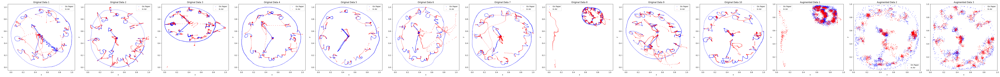

Epoch 161/300: 100%|██████████| 77/77 [00:01<00:00, 48.35batch/s, Total Loss=0.00227, Reconstruction Loss=0.000753, KL Loss=0.152] 


Epoch 161: Total Loss = 0.001572, Reconstruction Loss = 0.000526, KL Divergence Loss = 0.104588
MAE = 0.261789, MSE = 0.103301, NRMSE = 0.321029


Epoch 162/300: 100%|██████████| 77/77 [00:01<00:00, 52.84batch/s, Total Loss=0.00134, Reconstruction Loss=0.000257, KL Loss=0.108]


Epoch 162: Total Loss = 0.001742, Reconstruction Loss = 0.000480, KL Divergence Loss = 0.126214
MAE = 0.262598, MSE = 0.103796, NRMSE = 0.321807


Epoch 163/300: 100%|██████████| 77/77 [00:01<00:00, 50.82batch/s, Total Loss=0.00118, Reconstruction Loss=0.000234, KL Loss=0.0946]


Epoch 163: Total Loss = 0.001274, Reconstruction Loss = 0.000289, KL Divergence Loss = 0.098511
MAE = 0.261350, MSE = 0.102684, NRMSE = 0.320088


Epoch 164/300: 100%|██████████| 77/77 [00:01<00:00, 42.80batch/s, Total Loss=0.00116, Reconstruction Loss=0.000246, KL Loss=0.0913]


Epoch 164: Total Loss = 0.001183, Reconstruction Loss = 0.000266, KL Divergence Loss = 0.091689
MAE = 0.263022, MSE = 0.104336, NRMSE = 0.322628


Epoch 165/300: 100%|██████████| 77/77 [00:01<00:00, 45.16batch/s, Total Loss=0.0011, Reconstruction Loss=0.000211, KL Loss=0.0886] 


Epoch 165: Total Loss = 0.001153, Reconstruction Loss = 0.000262, KL Divergence Loss = 0.089085
MAE = 0.263492, MSE = 0.104970, NRMSE = 0.323618


Epoch 166/300: 100%|██████████| 77/77 [00:02<00:00, 34.20batch/s, Total Loss=0.00113, Reconstruction Loss=0.000238, KL Loss=0.0891]


Epoch 166: Total Loss = 0.001187, Reconstruction Loss = 0.000270, KL Divergence Loss = 0.091710
MAE = 0.263838, MSE = 0.104898, NRMSE = 0.323557


Epoch 167/300: 100%|██████████| 77/77 [00:02<00:00, 35.68batch/s, Total Loss=0.0011, Reconstruction Loss=0.000212, KL Loss=0.0886] 


Epoch 167: Total Loss = 0.001134, Reconstruction Loss = 0.000255, KL Divergence Loss = 0.087902
MAE = 0.266462, MSE = 0.106996, NRMSE = 0.326740


Epoch 168/300: 100%|██████████| 77/77 [00:01<00:00, 46.26batch/s, Total Loss=0.0011, Reconstruction Loss=0.00022, KL Loss=0.0878]  


Epoch 168: Total Loss = 0.001125, Reconstruction Loss = 0.000250, KL Divergence Loss = 0.087526
MAE = 0.265228, MSE = 0.106376, NRMSE = 0.325716


Epoch 169/300: 100%|██████████| 77/77 [00:01<00:00, 38.78batch/s, Total Loss=0.00108, Reconstruction Loss=0.000223, KL Loss=0.0857]


Epoch 169: Total Loss = 0.001121, Reconstruction Loss = 0.000253, KL Divergence Loss = 0.086743
MAE = 0.266574, MSE = 0.107196, NRMSE = 0.327079


Epoch 170/300: 100%|██████████| 77/77 [00:01<00:00, 40.01batch/s, Total Loss=0.00787, Reconstruction Loss=0.00659, KL Loss=0.128]  


Epoch 170: Total Loss = 0.001425, Reconstruction Loss = 0.000542, KL Divergence Loss = 0.088310
MAE = 0.269053, MSE = 0.109512, NRMSE = 0.330726


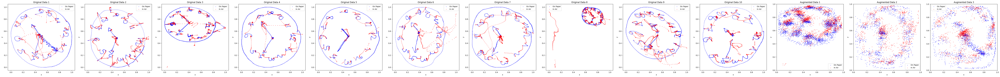

Epoch 171/300: 100%|██████████| 77/77 [00:01<00:00, 42.67batch/s, Total Loss=0.0014, Reconstruction Loss=0.00041, KL Loss=0.0994]  


Epoch 171: Total Loss = 0.002428, Reconstruction Loss = 0.001246, KL Divergence Loss = 0.118270
MAE = 0.259910, MSE = 0.101739, NRMSE = 0.318656


Epoch 172/300: 100%|██████████| 77/77 [00:01<00:00, 43.19batch/s, Total Loss=0.00119, Reconstruction Loss=0.000275, KL Loss=0.0912]


Epoch 172: Total Loss = 0.001304, Reconstruction Loss = 0.000355, KL Divergence Loss = 0.094896
MAE = 0.262104, MSE = 0.103429, NRMSE = 0.321300


Epoch 173/300: 100%|██████████| 77/77 [00:01<00:00, 43.48batch/s, Total Loss=0.00112, Reconstruction Loss=0.000253, KL Loss=0.0872]


Epoch 173: Total Loss = 0.001176, Reconstruction Loss = 0.000281, KL Divergence Loss = 0.089535
MAE = 0.262611, MSE = 0.103967, NRMSE = 0.322112


Epoch 174/300: 100%|██████████| 77/77 [00:01<00:00, 46.94batch/s, Total Loss=0.00115, Reconstruction Loss=0.000286, KL Loss=0.0866]


Epoch 174: Total Loss = 0.001138, Reconstruction Loss = 0.000267, KL Divergence Loss = 0.087155
MAE = 0.264036, MSE = 0.104993, NRMSE = 0.323671


Epoch 175/300: 100%|██████████| 77/77 [00:01<00:00, 40.37batch/s, Total Loss=0.00189, Reconstruction Loss=0.000858, KL Loss=0.104] 


Epoch 175: Total Loss = 0.001428, Reconstruction Loss = 0.000511, KL Divergence Loss = 0.091714
MAE = 0.266782, MSE = 0.107386, NRMSE = 0.327400


Epoch 176/300: 100%|██████████| 77/77 [00:01<00:00, 46.49batch/s, Total Loss=0.00115, Reconstruction Loss=0.000248, KL Loss=0.0906]


Epoch 176: Total Loss = 0.001554, Reconstruction Loss = 0.000501, KL Divergence Loss = 0.105351
MAE = 0.265558, MSE = 0.106370, NRMSE = 0.325823


Epoch 177/300: 100%|██████████| 77/77 [00:01<00:00, 42.93batch/s, Total Loss=0.00109, Reconstruction Loss=0.000225, KL Loss=0.0865]


Epoch 177: Total Loss = 0.001156, Reconstruction Loss = 0.000273, KL Divergence Loss = 0.088369
MAE = 0.266459, MSE = 0.106824, NRMSE = 0.326497


Epoch 178/300: 100%|██████████| 77/77 [00:01<00:00, 45.38batch/s, Total Loss=0.0011, Reconstruction Loss=0.000242, KL Loss=0.0854] 


Epoch 178: Total Loss = 0.001112, Reconstruction Loss = 0.000257, KL Divergence Loss = 0.085469
MAE = 0.265445, MSE = 0.106309, NRMSE = 0.325698


Epoch 179/300: 100%|██████████| 77/77 [00:01<00:00, 44.16batch/s, Total Loss=0.00103, Reconstruction Loss=0.000195, KL Loss=0.0836]


Epoch 179: Total Loss = 0.001092, Reconstruction Loss = 0.000249, KL Divergence Loss = 0.084328
MAE = 0.266583, MSE = 0.106998, NRMSE = 0.326754


Epoch 180/300: 100%|██████████| 77/77 [00:01<00:00, 44.37batch/s, Total Loss=0.00107, Reconstruction Loss=0.000216, KL Loss=0.0853]


Epoch 180: Total Loss = 0.001082, Reconstruction Loss = 0.000245, KL Divergence Loss = 0.083727
MAE = 0.268558, MSE = 0.108661, NRMSE = 0.329312


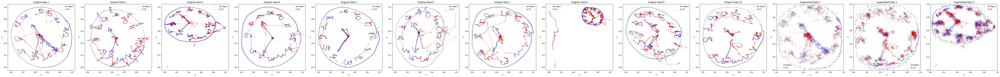

Epoch 181/300: 100%|██████████| 77/77 [00:01<00:00, 43.20batch/s, Total Loss=0.00159, Reconstruction Loss=0.000441, KL Loss=0.115] 


Epoch 181: Total Loss = 0.002206, Reconstruction Loss = 0.001035, KL Divergence Loss = 0.117104
MAE = 0.270503, MSE = 0.110381, NRMSE = 0.331890


Epoch 182/300: 100%|██████████| 77/77 [00:01<00:00, 47.34batch/s, Total Loss=0.00116, Reconstruction Loss=0.000238, KL Loss=0.0917]


Epoch 182: Total Loss = 0.001337, Reconstruction Loss = 0.000341, KL Divergence Loss = 0.099554
MAE = 0.270737, MSE = 0.110377, NRMSE = 0.331852


Epoch 183/300: 100%|██████████| 77/77 [00:01<00:00, 43.15batch/s, Total Loss=0.00109, Reconstruction Loss=0.000224, KL Loss=0.0864]


Epoch 183: Total Loss = 0.001150, Reconstruction Loss = 0.000264, KL Divergence Loss = 0.088611
MAE = 0.270599, MSE = 0.110676, NRMSE = 0.332315


Epoch 184/300: 100%|██████████| 77/77 [00:01<00:00, 43.41batch/s, Total Loss=0.00102, Reconstruction Loss=0.000182, KL Loss=0.084] 


Epoch 184: Total Loss = 0.001091, Reconstruction Loss = 0.000240, KL Divergence Loss = 0.085082
MAE = 0.269413, MSE = 0.109674, NRMSE = 0.330842


Epoch 185/300: 100%|██████████| 77/77 [00:01<00:00, 45.14batch/s, Total Loss=0.00103, Reconstruction Loss=0.000211, KL Loss=0.0824]


Epoch 185: Total Loss = 0.001069, Reconstruction Loss = 0.000235, KL Divergence Loss = 0.083367
MAE = 0.270690, MSE = 0.110625, NRMSE = 0.332282


Epoch 186/300: 100%|██████████| 77/77 [00:01<00:00, 44.73batch/s, Total Loss=0.001, Reconstruction Loss=0.00019, KL Loss=0.0814]   


Epoch 186: Total Loss = 0.001052, Reconstruction Loss = 0.000229, KL Divergence Loss = 0.082265
MAE = 0.270817, MSE = 0.110937, NRMSE = 0.332703


Epoch 187/300: 100%|██████████| 77/77 [00:01<00:00, 43.19batch/s, Total Loss=0.00101, Reconstruction Loss=0.0002, KL Loss=0.0805]  


Epoch 187: Total Loss = 0.001038, Reconstruction Loss = 0.000226, KL Divergence Loss = 0.081246
MAE = 0.270724, MSE = 0.110592, NRMSE = 0.332222


Epoch 188/300: 100%|██████████| 77/77 [00:01<00:00, 42.47batch/s, Total Loss=0.00125, Reconstruction Loss=0.000252, KL Loss=0.0997] 


Epoch 188: Total Loss = 0.001118, Reconstruction Loss = 0.000274, KL Divergence Loss = 0.084362
MAE = 0.269966, MSE = 0.110277, NRMSE = 0.331844


Epoch 189/300: 100%|██████████| 77/77 [00:01<00:00, 43.63batch/s, Total Loss=0.00105, Reconstruction Loss=0.000214, KL Loss=0.0834]


Epoch 189: Total Loss = 0.001121, Reconstruction Loss = 0.000237, KL Divergence Loss = 0.088477
MAE = 0.269258, MSE = 0.109648, NRMSE = 0.330821


Epoch 190/300: 100%|██████████| 77/77 [00:01<00:00, 43.98batch/s, Total Loss=0.00146, Reconstruction Loss=0.000457, KL Loss=0.101] 


Epoch 190: Total Loss = 0.001478, Reconstruction Loss = 0.000566, KL Divergence Loss = 0.091225
MAE = 0.273834, MSE = 0.113054, NRMSE = 0.335969


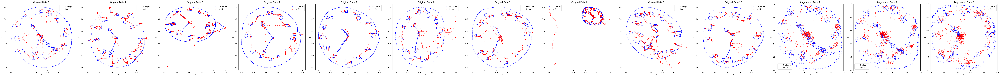

Epoch 191/300: 100%|██████████| 77/77 [00:01<00:00, 44.01batch/s, Total Loss=0.00104, Reconstruction Loss=0.000198, KL Loss=0.0846]


Epoch 191: Total Loss = 0.001184, Reconstruction Loss = 0.000297, KL Divergence Loss = 0.088731
MAE = 0.272878, MSE = 0.112556, NRMSE = 0.335216


Epoch 192/300: 100%|██████████| 77/77 [00:01<00:00, 47.35batch/s, Total Loss=0.00104, Reconstruction Loss=0.000212, KL Loss=0.0827]


Epoch 192: Total Loss = 0.001126, Reconstruction Loss = 0.000258, KL Divergence Loss = 0.086786
MAE = 0.273988, MSE = 0.113103, NRMSE = 0.336028


Epoch 193/300: 100%|██████████| 77/77 [00:01<00:00, 49.27batch/s, Total Loss=0.00102, Reconstruction Loss=0.000216, KL Loss=0.0808] 


Epoch 193: Total Loss = 0.001036, Reconstruction Loss = 0.000223, KL Divergence Loss = 0.081207
MAE = 0.272048, MSE = 0.111845, NRMSE = 0.334191


Epoch 194/300: 100%|██████████| 77/77 [00:01<00:00, 47.37batch/s, Total Loss=0.000995, Reconstruction Loss=0.000199, KL Loss=0.0796]


Epoch 194: Total Loss = 0.001030, Reconstruction Loss = 0.000227, KL Divergence Loss = 0.080327
MAE = 0.271836, MSE = 0.112012, NRMSE = 0.334374


Epoch 195/300: 100%|██████████| 77/77 [00:01<00:00, 48.81batch/s, Total Loss=0.000994, Reconstruction Loss=0.000204, KL Loss=0.0789]


Epoch 195: Total Loss = 0.001012, Reconstruction Loss = 0.000223, KL Divergence Loss = 0.078949
MAE = 0.272585, MSE = 0.112240, NRMSE = 0.334821


Epoch 196/300: 100%|██████████| 77/77 [00:01<00:00, 45.21batch/s, Total Loss=0.000989, Reconstruction Loss=0.000206, KL Loss=0.0784]


Epoch 196: Total Loss = 0.001007, Reconstruction Loss = 0.000222, KL Divergence Loss = 0.078461
MAE = 0.271899, MSE = 0.112108, NRMSE = 0.334579


Epoch 197/300: 100%|██████████| 77/77 [00:01<00:00, 43.58batch/s, Total Loss=0.00098, Reconstruction Loss=0.000194, KL Loss=0.0786] 


Epoch 197: Total Loss = 0.001004, Reconstruction Loss = 0.000221, KL Divergence Loss = 0.078301
MAE = 0.271787, MSE = 0.111798, NRMSE = 0.334152


Epoch 198/300: 100%|██████████| 77/77 [00:01<00:00, 43.61batch/s, Total Loss=0.000965, Reconstruction Loss=0.000196, KL Loss=0.0769]


Epoch 198: Total Loss = 0.000999, Reconstruction Loss = 0.000221, KL Divergence Loss = 0.077732
MAE = 0.272470, MSE = 0.112154, NRMSE = 0.334694


Epoch 199/300: 100%|██████████| 77/77 [00:01<00:00, 43.21batch/s, Total Loss=0.00118, Reconstruction Loss=0.000242, KL Loss=0.0938] 


Epoch 199: Total Loss = 0.001057, Reconstruction Loss = 0.000246, KL Divergence Loss = 0.081073
MAE = 0.272713, MSE = 0.112374, NRMSE = 0.334978


Epoch 200/300: 100%|██████████| 77/77 [00:01<00:00, 46.49batch/s, Total Loss=0.000956, Reconstruction Loss=0.000183, KL Loss=0.0773]


Epoch 200: Total Loss = 0.001043, Reconstruction Loss = 0.000212, KL Divergence Loss = 0.083108
MAE = 0.273416, MSE = 0.113143, NRMSE = 0.336088


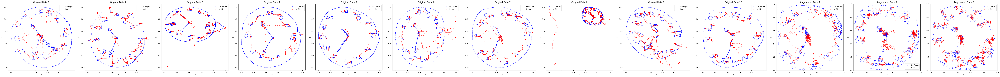

Epoch 201/300: 100%|██████████| 77/77 [01:42<00:00,  1.33s/batch, Total Loss=-0.138, Reconstruction Loss=0.000309, KL Loss=0.0938]


LSTM training at epoch 201: Discriminator Loss = [0.8211109]
Epoch 201: Total Loss = -0.136371, Reconstruction Loss = 0.001101, KL Divergence Loss = 0.121396
MAE = 0.274711, MSE = 0.113543, NRMSE = 0.336731


Epoch 202/300: 100%|██████████| 77/77 [00:01<00:00, 48.41batch/s, Total Loss=0.00105, Reconstruction Loss=0.000199, KL Loss=0.0854]


Epoch 202: Total Loss = 0.001171, Reconstruction Loss = 0.000279, KL Divergence Loss = 0.089176
MAE = 0.273671, MSE = 0.112894, NRMSE = 0.335737


Epoch 203/300: 100%|██████████| 77/77 [00:01<00:00, 49.95batch/s, Total Loss=0.00105, Reconstruction Loss=0.000219, KL Loss=0.0826]


Epoch 203: Total Loss = 0.001083, Reconstruction Loss = 0.000244, KL Divergence Loss = 0.083947
MAE = 0.272542, MSE = 0.112020, NRMSE = 0.334422


Epoch 204/300: 100%|██████████| 77/77 [00:01<00:00, 48.18batch/s, Total Loss=0.000984, Reconstruction Loss=0.00018, KL Loss=0.0804] 


Epoch 204: Total Loss = 0.001040, Reconstruction Loss = 0.000226, KL Divergence Loss = 0.081406
MAE = 0.273078, MSE = 0.112659, NRMSE = 0.335424


Epoch 205/300: 100%|██████████| 77/77 [00:01<00:00, 45.18batch/s, Total Loss=0.00098, Reconstruction Loss=0.00019, KL Loss=0.079]   


Epoch 205: Total Loss = 0.001019, Reconstruction Loss = 0.000224, KL Divergence Loss = 0.079495
MAE = 0.273363, MSE = 0.112797, NRMSE = 0.335652


Epoch 206/300: 100%|██████████| 77/77 [00:01<00:00, 40.04batch/s, Total Loss=0.000978, Reconstruction Loss=0.000189, KL Loss=0.0789]


Epoch 206: Total Loss = 0.001010, Reconstruction Loss = 0.000226, KL Divergence Loss = 0.078386
MAE = 0.273278, MSE = 0.112815, NRMSE = 0.335652


Epoch 207/300: 100%|██████████| 77/77 [00:01<00:00, 45.18batch/s, Total Loss=0.00237, Reconstruction Loss=0.00119, KL Loss=0.118]   


Epoch 207: Total Loss = 0.002599, Reconstruction Loss = 0.001423, KL Divergence Loss = 0.117544
MAE = 0.263974, MSE = 0.105183, NRMSE = 0.324041


Epoch 208/300: 100%|██████████| 77/77 [00:02<00:00, 32.21batch/s, Total Loss=0.00125, Reconstruction Loss=0.000297, KL Loss=0.0948]


Epoch 208: Total Loss = 0.001742, Reconstruction Loss = 0.000629, KL Divergence Loss = 0.111288
MAE = 0.266290, MSE = 0.106984, NRMSE = 0.326829


Epoch 209/300: 100%|██████████| 77/77 [00:02<00:00, 35.95batch/s, Total Loss=0.00109, Reconstruction Loss=0.000233, KL Loss=0.0861]


Epoch 209: Total Loss = 0.001175, Reconstruction Loss = 0.000278, KL Divergence Loss = 0.089730
MAE = 0.267191, MSE = 0.107493, NRMSE = 0.327642


Epoch 210/300: 100%|██████████| 77/77 [00:02<00:00, 37.88batch/s, Total Loss=0.00102, Reconstruction Loss=0.000202, KL Loss=0.0823]


Epoch 210: Total Loss = 0.001088, Reconstruction Loss = 0.000250, KL Divergence Loss = 0.083866
MAE = 0.268309, MSE = 0.108556, NRMSE = 0.329224


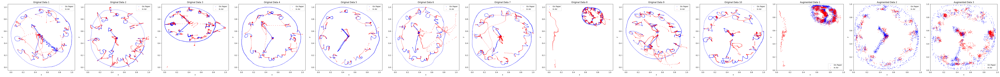

Epoch 211/300: 100%|██████████| 77/77 [00:02<00:00, 38.49batch/s, Total Loss=0.00102, Reconstruction Loss=0.000207, KL Loss=0.081] 


Epoch 211: Total Loss = 0.001058, Reconstruction Loss = 0.000243, KL Divergence Loss = 0.081471
MAE = 0.268281, MSE = 0.108879, NRMSE = 0.329733


Epoch 212/300: 100%|██████████| 77/77 [00:01<00:00, 41.39batch/s, Total Loss=0.000992, Reconstruction Loss=0.000192, KL Loss=0.08]  


Epoch 212: Total Loss = 0.001020, Reconstruction Loss = 0.000221, KL Divergence Loss = 0.079884
MAE = 0.268719, MSE = 0.109298, NRMSE = 0.330332


Epoch 213/300: 100%|██████████| 77/77 [00:01<00:00, 40.38batch/s, Total Loss=0.000977, Reconstruction Loss=0.000197, KL Loss=0.078] 


Epoch 213: Total Loss = 0.001005, Reconstruction Loss = 0.000220, KL Divergence Loss = 0.078495
MAE = 0.269671, MSE = 0.109760, NRMSE = 0.331036


Epoch 214/300: 100%|██████████| 77/77 [00:02<00:00, 35.69batch/s, Total Loss=0.000956, Reconstruction Loss=0.000179, KL Loss=0.0777]


Epoch 214: Total Loss = 0.000999, Reconstruction Loss = 0.000212, KL Divergence Loss = 0.078608
MAE = 0.269788, MSE = 0.110242, NRMSE = 0.331784


Epoch 215/300: 100%|██████████| 77/77 [00:01<00:00, 42.82batch/s, Total Loss=0.000947, Reconstruction Loss=0.000177, KL Loss=0.077] 


Epoch 215: Total Loss = 0.000978, Reconstruction Loss = 0.000205, KL Divergence Loss = 0.077250
MAE = 0.270465, MSE = 0.110806, NRMSE = 0.332615


Epoch 216/300: 100%|██████████| 77/77 [00:01<00:00, 39.07batch/s, Total Loss=0.00102, Reconstruction Loss=0.00021, KL Loss=0.0812]  


Epoch 216: Total Loss = 0.001017, Reconstruction Loss = 0.000238, KL Divergence Loss = 0.077844
MAE = 0.274376, MSE = 0.113716, NRMSE = 0.337010


Epoch 217/300: 100%|██████████| 77/77 [00:02<00:00, 37.33batch/s, Total Loss=0.00109, Reconstruction Loss=0.000203, KL Loss=0.0886] 


Epoch 217: Total Loss = 0.001274, Reconstruction Loss = 0.000361, KL Divergence Loss = 0.091271
MAE = 0.272523, MSE = 0.112201, NRMSE = 0.334676


Epoch 218/300: 100%|██████████| 77/77 [00:01<00:00, 38.56batch/s, Total Loss=0.000984, Reconstruction Loss=0.000177, KL Loss=0.0808]


Epoch 218: Total Loss = 0.001036, Reconstruction Loss = 0.000211, KL Divergence Loss = 0.082437
MAE = 0.272815, MSE = 0.112413, NRMSE = 0.335029


Epoch 219/300: 100%|██████████| 77/77 [00:02<00:00, 38.48batch/s, Total Loss=0.000954, Reconstruction Loss=0.000189, KL Loss=0.0765]


Epoch 219: Total Loss = 0.000979, Reconstruction Loss = 0.000200, KL Divergence Loss = 0.077956
MAE = 0.271603, MSE = 0.111311, NRMSE = 0.333408


Epoch 220/300: 100%|██████████| 77/77 [00:02<00:00, 37.04batch/s, Total Loss=0.000938, Reconstruction Loss=0.000176, KL Loss=0.0762]


Epoch 220: Total Loss = 0.000965, Reconstruction Loss = 0.000202, KL Divergence Loss = 0.076279
MAE = 0.272360, MSE = 0.111813, NRMSE = 0.334128


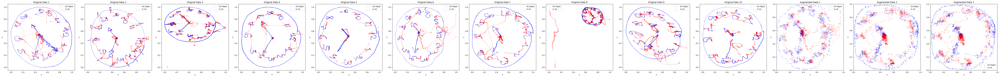

Epoch 221/300: 100%|██████████| 77/77 [00:22<00:00,  3.46batch/s, Total Loss=-0.144, Reconstruction Loss=0.00795, KL Loss=0.145] 


LSTM training at epoch 221: Discriminator Loss = [0.16437155]
Epoch 221: Total Loss = -0.143279, Reconstruction Loss = 0.008825, KL Divergence Loss = 0.098856
MAE = 0.260346, MSE = 0.102284, NRMSE = 0.319372


Epoch 222/300: 100%|██████████| 77/77 [00:01<00:00, 47.33batch/s, Total Loss=0.00136, Reconstruction Loss=0.000428, KL Loss=0.0932]


Epoch 222: Total Loss = 0.002367, Reconstruction Loss = 0.001293, KL Divergence Loss = 0.107394
MAE = 0.257328, MSE = 0.099793, NRMSE = 0.315477


Epoch 223/300: 100%|██████████| 77/77 [00:01<00:00, 48.27batch/s, Total Loss=0.00116, Reconstruction Loss=0.000314, KL Loss=0.0851]


Epoch 223: Total Loss = 0.001281, Reconstruction Loss = 0.000394, KL Divergence Loss = 0.088672
MAE = 0.259957, MSE = 0.101926, NRMSE = 0.318907


Epoch 224/300: 100%|██████████| 77/77 [00:01<00:00, 50.24batch/s, Total Loss=0.00108, Reconstruction Loss=0.000258, KL Loss=0.0819]


Epoch 224: Total Loss = 0.001121, Reconstruction Loss = 0.000295, KL Divergence Loss = 0.082634
MAE = 0.261058, MSE = 0.102621, NRMSE = 0.320034


Epoch 225/300: 100%|██████████| 77/77 [00:01<00:00, 45.18batch/s, Total Loss=0.00102, Reconstruction Loss=0.000216, KL Loss=0.0799]


Epoch 225: Total Loss = 0.001053, Reconstruction Loss = 0.000253, KL Divergence Loss = 0.079963
MAE = 0.262000, MSE = 0.103490, NRMSE = 0.321403


Epoch 226/300: 100%|██████████| 77/77 [00:01<00:00, 51.30batch/s, Total Loss=0.000964, Reconstruction Loss=0.000191, KL Loss=0.0773]


Epoch 226: Total Loss = 0.001015, Reconstruction Loss = 0.000232, KL Divergence Loss = 0.078313
MAE = 0.262762, MSE = 0.104368, NRMSE = 0.322716


Epoch 227/300: 100%|██████████| 77/77 [00:01<00:00, 50.24batch/s, Total Loss=0.000957, Reconstruction Loss=0.000193, KL Loss=0.0764]


Epoch 227: Total Loss = 0.000992, Reconstruction Loss = 0.000221, KL Divergence Loss = 0.077060
MAE = 0.263615, MSE = 0.104829, NRMSE = 0.323427


Epoch 228/300: 100%|██████████| 77/77 [00:01<00:00, 51.85batch/s, Total Loss=0.000953, Reconstruction Loss=0.000184, KL Loss=0.0769]


Epoch 228: Total Loss = 0.000978, Reconstruction Loss = 0.000213, KL Divergence Loss = 0.076426
MAE = 0.264605, MSE = 0.105565, NRMSE = 0.324607


Epoch 229/300: 100%|██████████| 77/77 [00:01<00:00, 48.76batch/s, Total Loss=0.00095, Reconstruction Loss=0.000187, KL Loss=0.0763] 


Epoch 229: Total Loss = 0.000973, Reconstruction Loss = 0.000206, KL Divergence Loss = 0.076696
MAE = 0.266605, MSE = 0.107226, NRMSE = 0.327140


Epoch 230/300: 100%|██████████| 77/77 [00:01<00:00, 50.75batch/s, Total Loss=0.000935, Reconstruction Loss=0.00018, KL Loss=0.0755] 


Epoch 230: Total Loss = 0.000955, Reconstruction Loss = 0.000204, KL Divergence Loss = 0.075075
MAE = 0.266567, MSE = 0.107229, NRMSE = 0.327079


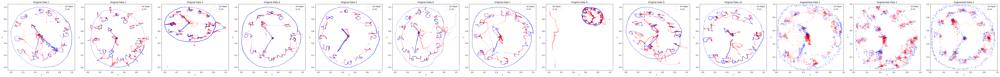

Epoch 231/300: 100%|██████████| 77/77 [00:01<00:00, 50.78batch/s, Total Loss=0.000911, Reconstruction Loss=0.000169, KL Loss=0.0742]


Epoch 231: Total Loss = 0.000937, Reconstruction Loss = 0.000194, KL Divergence Loss = 0.074287
MAE = 0.265692, MSE = 0.106887, NRMSE = 0.326685


Epoch 232/300: 100%|██████████| 77/77 [00:01<00:00, 46.46batch/s, Total Loss=0.000905, Reconstruction Loss=0.000164, KL Loss=0.0741]


Epoch 232: Total Loss = 0.000940, Reconstruction Loss = 0.000193, KL Divergence Loss = 0.074687
MAE = 0.267146, MSE = 0.107722, NRMSE = 0.327884


Epoch 233/300: 100%|██████████| 77/77 [00:01<00:00, 46.88batch/s, Total Loss=0.000909, Reconstruction Loss=0.000173, KL Loss=0.0736]


Epoch 233: Total Loss = 0.000935, Reconstruction Loss = 0.000195, KL Divergence Loss = 0.073955
MAE = 0.267391, MSE = 0.108189, NRMSE = 0.328648


Epoch 234/300: 100%|██████████| 77/77 [00:01<00:00, 46.02batch/s, Total Loss=0.000886, Reconstruction Loss=0.000164, KL Loss=0.0722]


Epoch 234: Total Loss = 0.000916, Reconstruction Loss = 0.000190, KL Divergence Loss = 0.072644
MAE = 0.268121, MSE = 0.108567, NRMSE = 0.329203


Epoch 235/300: 100%|██████████| 77/77 [00:01<00:00, 50.76batch/s, Total Loss=0.000889, Reconstruction Loss=0.000169, KL Loss=0.072] 


Epoch 235: Total Loss = 0.000906, Reconstruction Loss = 0.000187, KL Divergence Loss = 0.071971
MAE = 0.269050, MSE = 0.109573, NRMSE = 0.330775


Epoch 236/300: 100%|██████████| 77/77 [00:01<00:00, 51.31batch/s, Total Loss=0.00101, Reconstruction Loss=0.000224, KL Loss=0.0781] 


Epoch 236: Total Loss = 0.000988, Reconstruction Loss = 0.000249, KL Divergence Loss = 0.073913
MAE = 0.272380, MSE = 0.112137, NRMSE = 0.334574


Epoch 237/300: 100%|██████████| 77/77 [00:01<00:00, 49.25batch/s, Total Loss=0.000885, Reconstruction Loss=0.000167, KL Loss=0.0717]


Epoch 237: Total Loss = 0.000943, Reconstruction Loss = 0.000203, KL Divergence Loss = 0.073961
MAE = 0.272069, MSE = 0.111887, NRMSE = 0.334265


Epoch 238/300: 100%|██████████| 77/77 [00:01<00:00, 48.77batch/s, Total Loss=0.000868, Reconstruction Loss=0.000159, KL Loss=0.0709]


Epoch 238: Total Loss = 0.000898, Reconstruction Loss = 0.000185, KL Divergence Loss = 0.071311
MAE = 0.271730, MSE = 0.111607, NRMSE = 0.333763


Epoch 239/300: 100%|██████████| 77/77 [00:01<00:00, 51.86batch/s, Total Loss=0.000874, Reconstruction Loss=0.000165, KL Loss=0.0709]


Epoch 239: Total Loss = 0.000897, Reconstruction Loss = 0.000183, KL Divergence Loss = 0.071364
MAE = 0.271016, MSE = 0.111170, NRMSE = 0.333147


Epoch 240/300: 100%|██████████| 77/77 [00:01<00:00, 51.31batch/s, Total Loss=0.000867, Reconstruction Loss=0.000164, KL Loss=0.0703]


Epoch 240: Total Loss = 0.000886, Reconstruction Loss = 0.000184, KL Divergence Loss = 0.070246
MAE = 0.271212, MSE = 0.111585, NRMSE = 0.333794


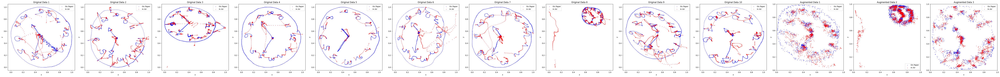

Epoch 241/300: 100%|██████████| 77/77 [00:20<00:00,  3.74batch/s, Total Loss=-0.411, Reconstruction Loss=0.0863, KL Loss=0.215]  


LSTM training at epoch 241: Discriminator Loss = [0.26392174]
Epoch 241: Total Loss = -0.352871, Reconstruction Loss = 0.118864, KL Divergence Loss = 0.207872
MAE = 0.253800, MSE = 0.097051, NRMSE = 0.310141


Epoch 242/300: 100%|██████████| 77/77 [00:01<00:00, 61.37batch/s, Total Loss=0.00571, Reconstruction Loss=0.00378, KL Loss=0.193]


Epoch 242: Total Loss = 0.024232, Reconstruction Loss = 0.022281, KL Divergence Loss = 0.195111
MAE = 0.253073, MSE = 0.095838, NRMSE = 0.308773


Epoch 243/300: 100%|██████████| 77/77 [00:01<00:00, 53.80batch/s, Total Loss=0.00346, Reconstruction Loss=0.0018, KL Loss=0.166] 


Epoch 243: Total Loss = 0.004135, Reconstruction Loss = 0.002305, KL Divergence Loss = 0.182988
MAE = 0.252625, MSE = 0.095506, NRMSE = 0.308146


Epoch 244/300: 100%|██████████| 77/77 [00:01<00:00, 50.29batch/s, Total Loss=0.00265, Reconstruction Loss=0.00128, KL Loss=0.137]


Epoch 244: Total Loss = 0.003177, Reconstruction Loss = 0.001647, KL Divergence Loss = 0.153026
MAE = 0.252325, MSE = 0.095027, NRMSE = 0.307477


Epoch 245/300: 100%|██████████| 77/77 [00:01<00:00, 52.76batch/s, Total Loss=0.00226, Reconstruction Loss=0.00108, KL Loss=0.118]


Epoch 245: Total Loss = 0.002620, Reconstruction Loss = 0.001334, KL Divergence Loss = 0.128625
MAE = 0.250741, MSE = 0.094153, NRMSE = 0.306036


Epoch 246/300: 100%|██████████| 77/77 [00:01<00:00, 57.49batch/s, Total Loss=0.00201, Reconstruction Loss=0.000929, KL Loss=0.108]


Epoch 246: Total Loss = 0.002201, Reconstruction Loss = 0.001060, KL Divergence Loss = 0.114176
MAE = 0.249893, MSE = 0.093551, NRMSE = 0.305170


Epoch 247/300: 100%|██████████| 77/77 [00:01<00:00, 45.22batch/s, Total Loss=0.00191, Reconstruction Loss=0.000769, KL Loss=0.114] 


Epoch 247: Total Loss = 0.002022, Reconstruction Loss = 0.000938, KL Divergence Loss = 0.108407
MAE = 0.250182, MSE = 0.093668, NRMSE = 0.305410


Epoch 248/300: 100%|██████████| 77/77 [00:01<00:00, 53.76batch/s, Total Loss=0.00169, Reconstruction Loss=0.000624, KL Loss=0.107]


Epoch 248: Total Loss = 0.001873, Reconstruction Loss = 0.000781, KL Divergence Loss = 0.109256
MAE = 0.252143, MSE = 0.094804, NRMSE = 0.307295


Epoch 249/300: 100%|██████████| 77/77 [00:01<00:00, 50.65batch/s, Total Loss=0.00147, Reconstruction Loss=0.000512, KL Loss=0.0955]


Epoch 249: Total Loss = 0.001661, Reconstruction Loss = 0.000642, KL Divergence Loss = 0.101852
MAE = 0.250557, MSE = 0.093951, NRMSE = 0.305942


Epoch 250/300: 100%|██████████| 77/77 [00:01<00:00, 48.01batch/s, Total Loss=0.00142, Reconstruction Loss=0.000499, KL Loss=0.092] 


Epoch 250: Total Loss = 0.001499, Reconstruction Loss = 0.000555, KL Divergence Loss = 0.094406
MAE = 0.251904, MSE = 0.094971, NRMSE = 0.307589


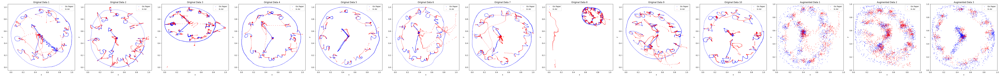

Epoch 251/300: 100%|██████████| 77/77 [00:01<00:00, 48.77batch/s, Total Loss=0.00135, Reconstruction Loss=0.000458, KL Loss=0.0888]


Epoch 251: Total Loss = 0.001403, Reconstruction Loss = 0.000497, KL Divergence Loss = 0.090593
MAE = 0.251517, MSE = 0.094747, NRMSE = 0.307281


Epoch 252/300: 100%|██████████| 77/77 [00:01<00:00, 44.39batch/s, Total Loss=0.00129, Reconstruction Loss=0.000424, KL Loss=0.0865]


Epoch 252: Total Loss = 0.001330, Reconstruction Loss = 0.000453, KL Divergence Loss = 0.087623
MAE = 0.252177, MSE = 0.095350, NRMSE = 0.308294


Epoch 253/300: 100%|██████████| 77/77 [00:01<00:00, 43.19batch/s, Total Loss=0.00121, Reconstruction Loss=0.000373, KL Loss=0.0837]


Epoch 253: Total Loss = 0.001274, Reconstruction Loss = 0.000419, KL Divergence Loss = 0.085481
MAE = 0.252881, MSE = 0.095922, NRMSE = 0.309119


Epoch 254/300: 100%|██████████| 77/77 [00:01<00:00, 48.13batch/s, Total Loss=0.00121, Reconstruction Loss=0.000363, KL Loss=0.0846]


Epoch 254: Total Loss = 0.001234, Reconstruction Loss = 0.000397, KL Divergence Loss = 0.083675
MAE = 0.253114, MSE = 0.096085, NRMSE = 0.309403


Epoch 255/300: 100%|██████████| 77/77 [00:01<00:00, 49.77batch/s, Total Loss=0.00115, Reconstruction Loss=0.000337, KL Loss=0.0817]


Epoch 255: Total Loss = 0.001190, Reconstruction Loss = 0.000369, KL Divergence Loss = 0.082105
MAE = 0.255935, MSE = 0.098108, NRMSE = 0.312708


Epoch 256/300: 100%|██████████| 77/77 [00:01<00:00, 48.31batch/s, Total Loss=0.00108, Reconstruction Loss=0.000278, KL Loss=0.0804]


Epoch 256: Total Loss = 0.001163, Reconstruction Loss = 0.000357, KL Divergence Loss = 0.080572
MAE = 0.255686, MSE = 0.098005, NRMSE = 0.312513


Epoch 257/300: 100%|██████████| 77/77 [00:01<00:00, 42.81batch/s, Total Loss=0.0011, Reconstruction Loss=0.000315, KL Loss=0.0784] 


Epoch 257: Total Loss = 0.001134, Reconstruction Loss = 0.000340, KL Divergence Loss = 0.079333
MAE = 0.256511, MSE = 0.098600, NRMSE = 0.313406


Epoch 258/300: 100%|██████████| 77/77 [00:01<00:00, 44.79batch/s, Total Loss=0.00128, Reconstruction Loss=0.000397, KL Loss=0.0884]


Epoch 258: Total Loss = 0.001164, Reconstruction Loss = 0.000364, KL Divergence Loss = 0.079903
MAE = 0.256918, MSE = 0.099026, NRMSE = 0.314107


Epoch 259/300: 100%|██████████| 77/77 [00:01<00:00, 48.75batch/s, Total Loss=0.00113, Reconstruction Loss=0.000311, KL Loss=0.0823]


Epoch 259: Total Loss = 0.001195, Reconstruction Loss = 0.000336, KL Divergence Loss = 0.085867
MAE = 0.259275, MSE = 0.100858, NRMSE = 0.317059


Epoch 260/300: 100%|██████████| 77/77 [00:01<00:00, 43.20batch/s, Total Loss=0.00103, Reconstruction Loss=0.000257, KL Loss=0.0775]


Epoch 260: Total Loss = 0.001098, Reconstruction Loss = 0.000301, KL Divergence Loss = 0.079664
MAE = 0.260063, MSE = 0.101352, NRMSE = 0.317783


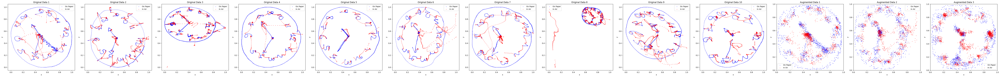

Epoch 261/300:  21%|██        | 16/77 [00:04<00:18,  3.36batch/s, Total Loss=-0.24, Reconstruction Loss=0.000411, KL Loss=0.0759] 


KeyboardInterrupt: 

In [35]:
# Cell 5
@tf.function
def train_vae_step(model, x, optimizer, lstm_discriminator=None):
    with tf.GradientTape() as tape:
        x_reconstructed, mean, logvar = model(x)
        reconstruction_loss, kl_loss, total_kl_loss = compute_loss(model, x)
        
        # Add LSTM discriminator loss if available
        if lstm_discriminator is not None:
            real_predictions = lstm_discriminator(tf.expand_dims(x, axis=0))
            fake_predictions = lstm_discriminator(tf.expand_dims(x_reconstructed, axis=0))
            discriminator_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.ones_like(real_predictions), real_predictions) +
                                                tf.keras.losses.binary_crossentropy(tf.zeros_like(fake_predictions), fake_predictions))
            total_loss = reconstruction_loss + total_kl_loss - 0.1 * discriminator_loss  # Adjust the weight as needed
        else:
            total_loss = reconstruction_loss + total_kl_loss
    
    gradients = tape.gradient(total_loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))
    return total_loss, reconstruction_loss, kl_loss

@tf.function
def train_lstm_step(lstm_model, real_data, generated_data, optimizer):
    with tf.GradientTape() as tape:
        real_predictions = lstm_model(real_data)
        generated_predictions = lstm_model(generated_data)
        real_loss = tf.keras.losses.binary_crossentropy(tf.ones_like(real_predictions), real_predictions)
        generated_loss = tf.keras.losses.binary_crossentropy(tf.zeros_like(generated_predictions), generated_predictions)
        total_loss = real_loss + generated_loss
    gradients = tape.gradient(total_loss, lstm_model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, lstm_model.trainable_variables))
    return total_loss

# Initialize LSTM discriminator and optimizer
lstm_discriminator = LSTMDiscriminator()
lstm_optimizer = tf.keras.optimizers.Adam(learning_rate)

batch_size = 512
train_datasets = [tf.data.Dataset.from_tensor_slices(data).shuffle(10000).batch(batch_size) for data in processed_data]

# Set up alternating epochs
vae_epochs = 200
lstm_interval = 20
epochs = 300

total_loss_history = []
reconstruction_loss_history = []
kl_loss_history = []
mae_history = []
mse_history = []
nrmse_history = []

for epoch in range(epochs):
    total_loss = 0
    reconstruction_loss_sum = 0
    kl_loss_sum = 0
    num_batches = sum(len(dataset) for dataset in train_datasets)

    with tqdm(total=num_batches, desc=f'Epoch {epoch+1}/{epochs}', unit='batch') as pbar:
        for dataset in train_datasets:
            for batch in dataset:
                # Use LSTM discriminator after vae_epochs and every lstm_interval
                use_lstm = epoch >= vae_epochs and (epoch - vae_epochs) % lstm_interval == 0
                total_loss_batch, reconstruction_loss, kl_loss = train_vae_step(vae, batch, optimizer, lstm_discriminator if use_lstm else None)
                total_loss += total_loss_batch
                reconstruction_loss_sum += reconstruction_loss
                kl_loss_sum += kl_loss
                pbar.update(1)
                pbar.set_postfix({'Total Loss': float(total_loss_batch), 'Reconstruction Loss': float(reconstruction_loss), 'KL Loss': float(kl_loss)})

    # Train the LSTM discriminator every lstm_interval epochs after vae_epochs
    if epoch >= vae_epochs and (epoch - vae_epochs) % lstm_interval == 0:
        for data in processed_data:
            augmented_data = vae.decode(tf.random.normal(shape=(data.shape[0], latent_dim))).numpy()
            real_data = tf.expand_dims(data, axis=0)  # Reshape for LSTM input
            generated_data = tf.expand_dims(augmented_data, axis=0)

            lstm_loss = train_lstm_step(lstm_discriminator, real_data, generated_data, lstm_optimizer)
        print(f'LSTM training at epoch {epoch+1}: Discriminator Loss = {lstm_loss.numpy()}')

    avg_total_loss = total_loss / num_batches
    avg_reconstruction_loss = reconstruction_loss_sum / num_batches
    avg_kl_loss = kl_loss_sum / num_batches

    total_loss_history.append(avg_total_loss)
    reconstruction_loss_history.append(avg_reconstruction_loss)
    kl_loss_history.append(avg_kl_loss)

    # Calculate MAE, MSE, NRMSE
    mae_sum, mse_sum, nrmse_sum = 0, 0, 0
    for data in processed_data:
        augmented_data = vae.decode(tf.random.normal(shape=(data.shape[0], latent_dim))).numpy()
        mae = mean_absolute_error(data[:, :2], augmented_data[:, :2])
        mse = mean_squared_error(data[:, :2], augmented_data[:, :2])
        rmse = np.sqrt(mse)
        nrmse = rmse / (data[:, :2].max() - data[:, :2].min())
        mae_sum += mae
        mse_sum += mse
        nrmse_sum += nrmse
    
    mae_avg = mae_sum / len(processed_data)
    mse_avg = mse_sum / len(processed_data)
    nrmse_avg = nrmse_sum / len(processed_data)

    mae_history.append(mae_avg)
    mse_history.append(mse_avg)
    nrmse_history.append(nrmse_avg)

    print(f"Epoch {epoch+1}: Total Loss = {avg_total_loss:.6f}, Reconstruction Loss = {avg_reconstruction_loss:.6f}, KL Divergence Loss = {avg_kl_loss:.6f}")
    print(f"MAE = {mae_avg:.6f}, MSE = {mse_avg:.6f}, NRMSE = {nrmse_avg:.6f}")

    if (epoch + 1) % 10 == 0:
        num_augmented_files = 3
        augmented_datasets = generate_augmented_data(vae, num_augmented_files, avg_data_points, processed_data)

        # Visualize the original and augmented data side by side
        fig, axs = plt.subplots(1, num_augmented_files + len(processed_data), figsize=(6*(num_augmented_files + len(processed_data)), 6))
        
        for i, original_data in enumerate(processed_data):
            original_on_paper = original_data[original_data[:, 3] == 1]
            original_in_air = original_data[original_data[:, 3] == 0]
            axs[i].scatter(original_on_paper[:, 0], original_on_paper[:, 1], c='b', s=1, label='On Paper')
            axs[i].scatter(original_in_air[:, 0], original_in_air[:, 1], c='r', s=1, label='In Air')
            axs[i].set_title(f'Original Data {i+1}')
            axs[i].set_xlabel('x')
            axs[i].set_ylabel('y')
            axs[i].set_aspect('equal')
            axs[i].legend()

        # Set consistent axis limits for square aspect ratio
        x_min = min(data[:, 0].min() for data in processed_data)
        x_max = max(data[:, 0].max() for data in processed_data)
        y_min = min(data[:, 1].min() for data in processed_data)
        y_max = max(data[:, 1].max() for data in processed_data)

        for i, augmented_data in enumerate(augmented_datasets):
            augmented_on_paper = augmented_data[augmented_data[:, 3] == 1]
            augmented_in_air = augmented_data[augmented_data[:, 3] == 0]
            axs[i+len(processed_data)].scatter(augmented_on_paper[:, 0], augmented_on_paper[:, 1], c='b', s=1, label='On Paper')
            axs[i+len(processed_data)].scatter(augmented_in_air[:, 0], augmented_in_air[:, 1], c='r', s=1, label='In Air')
            axs[i+len(processed_data)].set_title(f'Augmented Data {i+1}')
            axs[i+len(processed_data)].set_xlabel('x')
            axs[i+len(processed_data)].set_ylabel('y')
            axs[i+len(processed_data)].set_aspect('equal')
            axs[i+len(processed_data)].set_xlim(x_min, x_max)
            axs[i+len(processed_data)].set_ylim(y_min, y_max)
            axs[i+len(processed_data)].legend()

        plt.tight_layout()
        plt.show()

# Final output of metrics
print(f"Final MAE: {mae_history[-1]:.6f}")
print(f"Final MSE: {mse_history[-1]:.6f}")
print(f"Final NRMSE: {nrmse_history[-1]:.6f}")

print("Training completed.")
plt.ioff()  # Turn off interactive mode
plt.show()

# Plot loss history
plt.figure(figsize=(10, 5))
plt.plot(total_loss_history, label='Total Loss')
plt.plot(reconstruction_loss_history, label='Reconstruction Loss')
plt.plot(kl_loss_history, label='KL Divergence Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Epochs')
plt.legend()
plt.show()

# Plot MAE, MSE, and NRMSE history
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.plot(mae_history, label='MAE')
plt.xlabel('Epoch')
plt.ylabel('MAE')
plt.title('Mean Absolute Error Over Epochs')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(mse_history, label='MSE')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.title('Mean Squared Error Over Epochs')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(nrmse_history, label='NRMSE')
plt.xlabel('Epoch')
plt.ylabel('NRMSE')
plt.title('Normalized Root Mean Squared Error Over Epochs')
plt.legend()

plt.tight_layout()
plt.show()

In [14]:
# Cell 6
def download_augmented_data(augmented_datasets, scaler, directory='augmented_data'):
    if not os.path.exists(directory):
        os.makedirs(directory)

    for i, augmented_data in enumerate(augmented_datasets):
        augmented_data_original_scale = np.column_stack((
            scaler.inverse_transform(augmented_data[:, :3]),  # Inverse scale x, y, timestamp
            augmented_data[:, 3]  # Keep pen_status unchanged
        ))

        # Save each augmented dataset to a CSV file
        filename = os.path.join(directory, f'augmented_data_{i+1}.csv')
        pd.DataFrame(augmented_data_original_scale, columns=['x', 'y', 'timestamp', 'pen_status']).to_csv(filename, index=False)
        print(f"Saved {filename}")

# Call the updated function with the same scaler for all augmented datasets
download_augmented_data(augmented_datasets, scalers[0])


Saved augmented_data\augmented_data_1.csv
Saved augmented_data\augmented_data_2.csv
